<div class="alert alert-block alert-success">
    <h1 style="margin-bottom:0.5cm"><b>LAB 6: Clustering</b></h1>
    <p style="margin-bottom:0.25cm">Course 240317: <b>Data Analysis in Rehabilitation</b>
    <br>
        Master in Neuroengineering and Rehabilitation</p>
    <b>Prof. Joan F. Alonso</b>
    <br>
    <br>
</div>

<div class="alert alert-block alert-info">
    <p>In this lab session, we will:</p>
    <ul>
        <li><b>Use several <code style="background-color:transparent">sklearn</code> clustering methods on a toy dataset (ETC: 60 min)</b></li>
            <ul>
                <li>EDA, feature scaling</li>
                <li>Intuitive clustering: k-Means (partition-based)</li>
                <li>Evaluation of clustering performance</li>
                <li>Other clustering algoritms:</li>
                <ul>
                    <li>Hierarchiy-based</li>
                    <li>Density-based</li>
                    <li>Distribution-based</li>
                </ul>
            </ul>
        <li><b>Work on a real dataset (ETC: 90 min)</b></li>
            <ul>
                <li>The HFO dataset</li>
                <li>Clustering pathological and non-pathological HFOs</li>
                <li>Soft-clustering with GMMs</li>
                <li>Optional: cluster the stroke dataset</li>
            </ul>
    </ul>
</div>

# Clustering with  `scikit-learn`

We will start with the Iris Dataset from the previous session.

We already know that it is a fairly easy classification problem, but without _a priori_ knowledge on the labels, it becomes difficult to obtain the three groups corresponding to the three types of iris.

## Objective
Simply put, the objective of cluster analysis is to assign observations to groups (clusters) so that **observations within each group are similar to one another** with respect to variables or attributes of interest, and **the groups themselves stand apart from one another**.

Regarding the iris, **is there a pattern in the data that can help us to group the three species in a way that when we see a new iris we can identify the species it belongs to?**

Let's try and do it!

## Load libraries and dataset
A brief reminder on the [Iris Dataset](https://archive.ics.uci.edu/ml/datasets/iris):
- **150 instances, no missing data**
- **4 features**:
  - sepal length (cm)
  - sepal width  (cm)
  - petal length (cm)
  - petal width (cm)
- **3 classes of 50 instances each** (balanced class distribution), each class refers to a type of iris
- **Only one class is linearly separable** from the other 2

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, OPTICS
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.mixture import GaussianMixture
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.metrics import davies_bouldin_score, adjusted_mutual_info_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from pathlib import Path


SOURCE_PATH = Path().resolve()
DATA_PATH = SOURCE_PATH / "Data"
OUTPUT_PATH = SOURCE_PATH / "Output" / "Lab6"
OUTPUT_PATH.mkdir(parents=True, exist_ok=True)

data = pd.read_csv(DATA_PATH / "240317-05-iris.csv",
                   names=["SL", "SW", "PL", "PW", "Type"])

Let's take a look at the data:

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   SL      150 non-null    float64
 1   SW      150 non-null    float64
 2   PL      150 non-null    float64
 3   PW      150 non-null    float64
 4   Type    150 non-null    object 
dtypes: float64(4), object(1)
memory usage: 6.0+ KB


## Exploratory data analysis
Just as a reminder, let's do a pair plot to see the feature distributions again:

In [4]:
# Set plotting style
sns.set(context="notebook",
        font_scale=1.25,
        style="darkgrid",
        rc={'lines.linewidth': 2,
            'axes.linewidth': 1,
            'axes.edgecolor': 'black',
            'axes.axisbelow': True,
            })

# Divide dataset into features and target
X = data[['SL', 'SW', 'PL', 'PW']]
y = data.Type

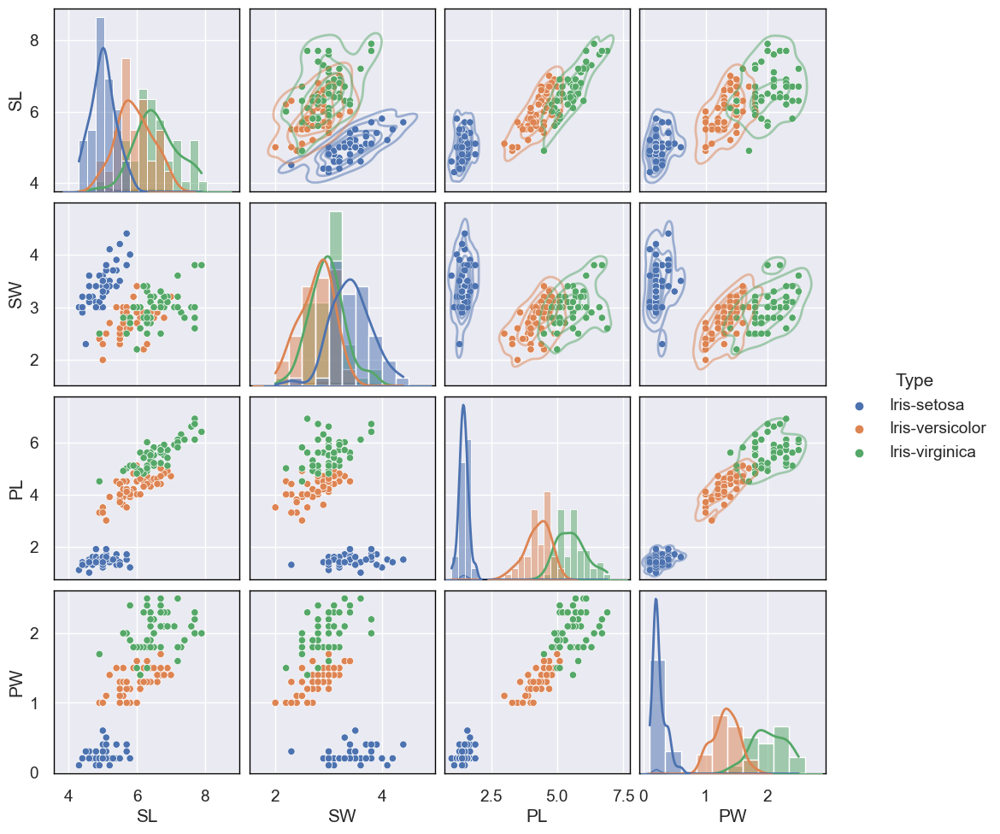

In [5]:
# Custom pairplot
g = sns.pairplot(data, hue="Type", grid_kws={'despine': False})
g.map_upper(sns.kdeplot, levels=5, alpha=0.5)
g.map_diag(sns.histplot, binwidth=0.25, kde=True, fill=True);

<div class="alert alert-block alert-info">
    <p>We can clearly see the grouping in the plots with the blue dots, which correspond to species setosa. The green and orange dots are not so clearly separable.</p>
</div>

## Clustering

<div>
<img src="attachment:sketching_idea_w.jpg" width="400"/>
</div>

### Feature scaling
The data is unbalanced (sepal length is around 4 times larger than petal width), so we should apply feature scaling or otherwise the larger features will dominate the others in clustering.

In [6]:
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

### k-Means clustering example
**k-Means** is probably the most famous and used clustering algorithm. It is an easy to understand and to apply algorithm that belongs to the **centroid-based methods** (also called partition-based).

The algorithm, however, makes some assumptions that are sometimes difficult to fullfill and therefore it will produce unintuitive and unexpected results (see some examples [here](https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_assumptions.html#sphx-glr-auto-examples-cluster-plot-kmeans-assumptions-py))

**What about our iris data?** Let's check:

In [7]:
# Fit clustering and extract assigned clusters
km3 = KMeans(n_clusters=3, n_init="auto", random_state=42)
km3.fit(X_scaled)
data['3-means'] = km3.labels_

# Plotting function
def plot_iris_clusters(ax, data, x, y, hue, title, *args):
    if not args or (args and args[0]):
        sns.kdeplot(data=data,
                    x=x, y=y,
                    hue=hue,
                    alpha=0.5,
                    levels=3,
                    palette="deep",
                    ax=ax)
    sns.scatterplot(data=data,
                    x=x, y=y,
                    hue=hue,
                    palette="deep",
                    ax=ax)
    ax.set_title(title, size=14)

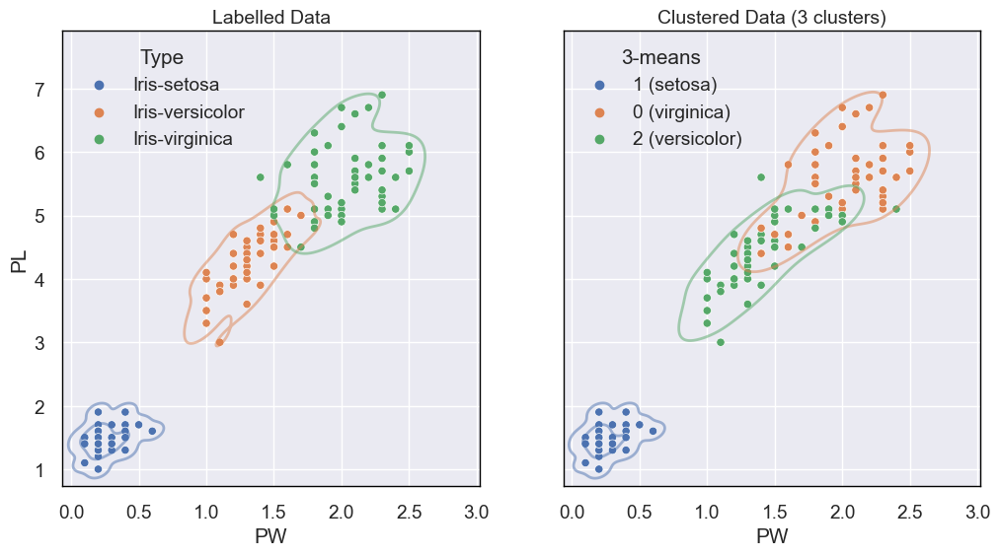

In [8]:
# Figure to compare labels and clusters
fig1, (ax11, ax12) = plt.subplots(
    nrows=1, ncols=2,
    sharex='all', sharey='all',
    figsize=(12, 6))
plot_iris_clusters(ax11, data, 'PW', 'PL',
                   'Type', 'Labelled Data')
legend_map = {0: '0 (virginica)',
              1: '1 (setosa)',
              2: '2 (versicolor)'}
plot_iris_clusters(ax12, data, 'PW', 'PL',
                   data['3-means'].map(legend_map),
                   'Clustered Data (3 clusters)')

The results do not look so bad, but it is clear that only the type *setosa* gets its own cluster correctly.

We have specified 3 clusters. What happens if we choose 2 or 4?

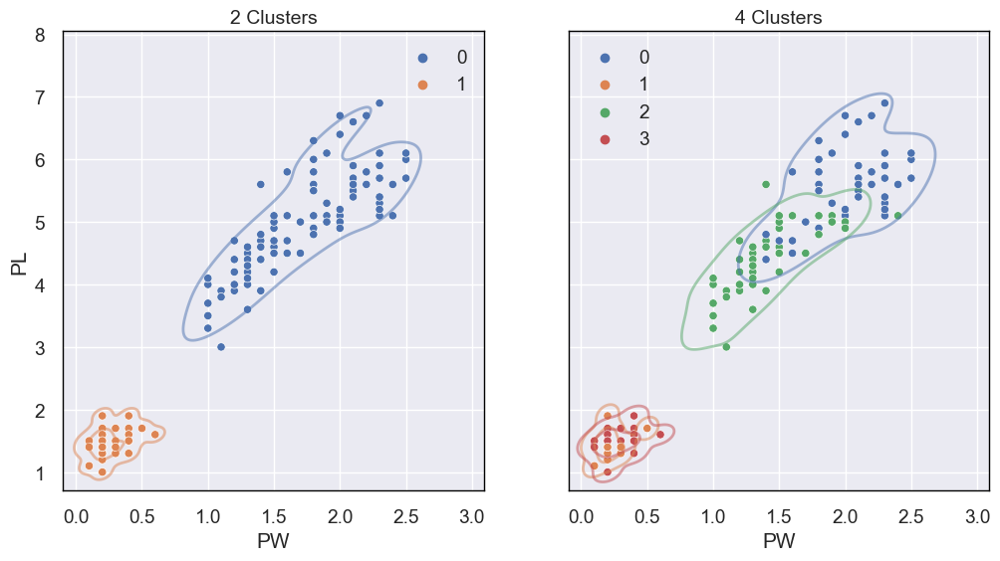

In [9]:
# Figure to compare other clusterings
fig2, (ax21, ax22) = plt.subplots(
    nrows=1, ncols=2,
    sharex='all', sharey='all',
    figsize=(12, 6))

km = KMeans(n_clusters=2, n_init="auto", random_state=42)
km.fit(X_scaled)
plot_iris_clusters(ax21, data, 'PW', 'PL',
                   km.labels_,
                   '2 Clusters')

km = KMeans(n_clusters=4, n_init="auto", random_state=42)
km.fit(X_scaled)
plot_iris_clusters(ax22, data, 'PW', 'PL',
                   km.labels_,
                   '4 Clusters')

<div class="alert alert-block alert-info">
    <p>Note that we are using <b>only 2 features for the scatter plots</b>.</p>
    <p>Later in the course we will learn how to project (reduce the number of dimensions) onto 2D using <b>LDA</b>, <b>PCA</b> or other methods taking into account <i>more than two</i> features</p>
</div>

Regarding the clustering results, we knew the best in advance, but what if the true labels were unknown to us?
- **How do we choose the number of clusters?**
- **How do we evaluate the _goodness_ of the clustering?**

Before clustering, we should make sure that the dataset has cluster tendency. We already knew this, so we can skip this part.
But for other datasets, the package [`pyclustertend`](https://pyclustertend.readthedocs.io/en/latest/index.html) can be useful to obtain the Hopkins statistic (H) or visual assessment of cluster tendency (VAT, reVAT).

As of March 2023 there is no `conda` version of this package, but it can be installed anyway using `conda skeleton`:
```
conda skeleton pypi pyclustertend
conda build pyclustertend
conda install --use-local pyclustertend
```

<div class="alert alert-block alert-warning">
    <p>You can also use <samp>pip install pyclustertend</samp>,<br>but mixing different package managers in an environment can do bad things to your mental health!</p>
</div>

## Choosing the optimal number of clusters

### Elbow method
The first approach we can use is the elbow method, and we will take advantage of the `yellowbrick` implementation:

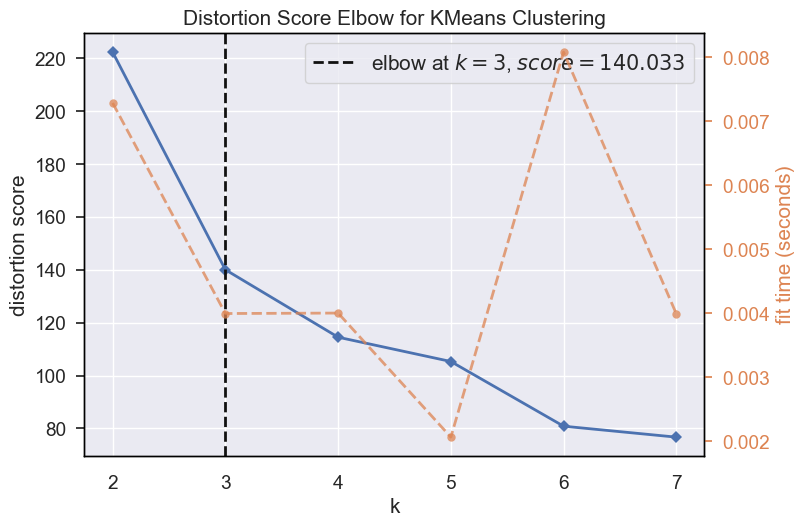

In [10]:
km = KMeans(n_init="auto")
elbow = KElbowVisualizer(km, k=(2, 8))
elbow.fit(X_scaled)
elbow.show();

By default, the scoring parameter is `distortion`, but we can also use `silhouette` and `calinski_harabasz`:

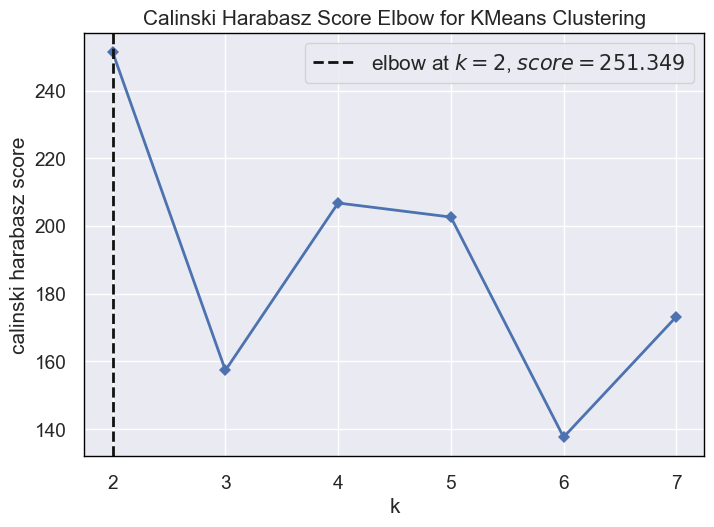

In [11]:
elbow = KElbowVisualizer(km, k=(2, 8),
                         metric='calinski_harabasz',
                         timings=False)
elbow.fit(X_scaled)
elbow.show();

If we want to use a different metric, then we cannot use `yellowbrick` and we have to code _a bit more_.

Let's try, for example, the [Davies-Bouldin Index](https://scikit-learn.org/stable/modules/clustering.html#davies-bouldin-index):

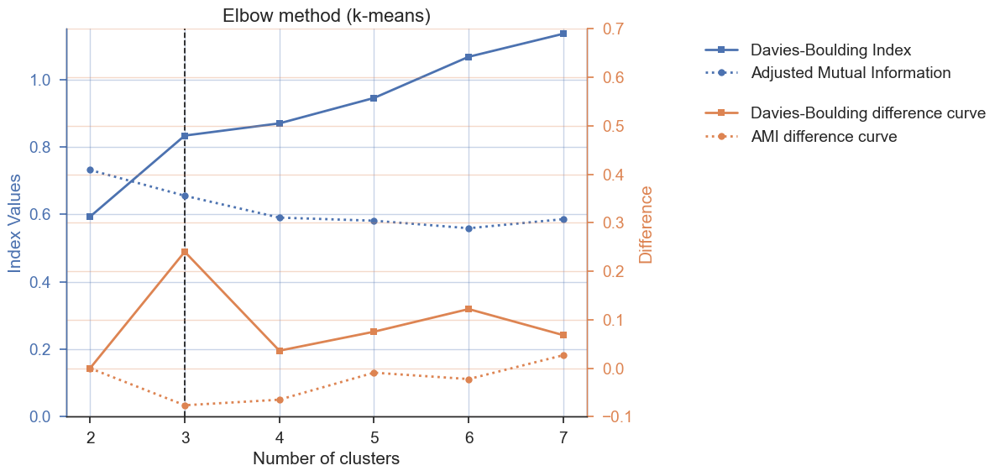

In [12]:
# Arrays to store/plot the scores
n_clusters = np.arange(2, 8)
db_scores = np.zeros(np.size(n_clusters))
ami_scores = np.zeros(np.size(n_clusters))

# encode classes into numbers (for AMI calculation)
encoder = LabelEncoder()
enc_labels = encoder.fit_transform(y)

# calculate scores for increasing number of clusters
for n in n_clusters:
    km = KMeans(n_clusters=n, n_init="auto", random_state=42).fit(X_scaled)
    db_scores[n-n_clusters[0]] = davies_bouldin_score(X_scaled, km.labels_)
    ami_scores[n-n_clusters[0]
               ] = adjusted_mutual_info_score(enc_labels, km.labels_)
    # print(f'Davies-Bouldin Index ({n} clusters) = {db_scores[n-n_clusters[0]]:0.4f}')

# plot results (changing seaborn style for this figure only)
with sns.axes_style('ticks'):
    fig3, ax31 = plt.subplots(figsize=(8, 6))
    ax32 = ax31.twinx()
    cycle_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    ax31.plot([3, 3], [0, 1.15], 'k--', linewidth=1.25)
    db = ax31.plot(n_clusters,
                   db_scores,
                   's-',
                   color=cycle_colors[0],
                   label='Davies-Boulding Index')
    dbdiff = ax32.plot(n_clusters,
                       np.diff(db_scores, prepend=db_scores[0]),
                       's-',
                       color=cycle_colors[1],
                       label='Davies-Boulding difference curve')
    ax31.plot(n_clusters,
              ami_scores,
              'o:',
              color=cycle_colors[0],
              label='Adjusted Mutual Information')
    ax32.plot(n_clusters,
              np.diff(ami_scores, prepend=ami_scores[0]),
              'o:',
              color=cycle_colors[1],
              label='AMI difference curve')

    # Customize axis limits and colors, add legends outside
    ax31.set_title('Elbow method (k-means)', size=16)
    ax31.set_ylabel('Index Values')
    ax31.yaxis.label.set_color(cycle_colors[0])
    ax31.spines['right'].set_edgecolor(cycle_colors[0])
    ax31.tick_params(axis='y', colors=cycle_colors[0])
    ax31.set_ylim(0, 1.15)
    ax31.set_xlabel('Number of clusters')
    ax31.spines['top'].set_visible(False)
    ax31.grid(color=cycle_colors[0], alpha=0.3)
    ax31.legend(bbox_to_anchor=(1.2, 1), loc='upper left')
    ax32.set_ylabel('Difference')
    ax32.yaxis.label.set_color(cycle_colors[1])
    ax32.spines['left'].set_edgecolor(cycle_colors[0])
    ax32.spines['right'].set_edgecolor(cycle_colors[1])
    ax32.spines['top'].set_visible(False)
    ax32.tick_params(axis='y', colors=cycle_colors[1])
    ax32.set_ylim(-0.1, 0.7)
    ax32.grid(color=cycle_colors[1], alpha=0.3)
    ax32.legend(bbox_to_anchor=(1.2, 0.75), loc='center left')

What can we conclude?
- The **Davies-Boulding index** shows an elbow for **3 clusters**. `yellowbrick` uses [this method](https://github.com/arvkevi/kneed) to find the elbow, but we can also look at the maximum value of the difference curve.
- The **adjusted mutual information**, which takes into account the true labels, has a **maximum value at $k=2$** (and so does its difference curve).

### Gap statistic
Instead of looking at these plots, we can use the [gap statistic](https://statweb.stanford.edu/~gwalther/gap). There's already a `conda` package for that (try `conda install -c milesgranger gap-stap`) but unfortunately with current versions of Python (Python >= 3.7) it fails to install.

As an alternative, we can copy-paste the (open source) code of the examples in [this notebook](https://anaconda.org/milesgranger/gap-statistic/notebook), look at [this implementation](https://datasciencelab.wordpress.com/tag/gap-statistic/), or try the `conda skeleton` approach with the `gap-stat` package.

<div class="alert alert-block alert-warning">
For now, the elbow method has given us the number of clusters that we were expecting, so we leave it as is.
</div>
    
### Silhouette plots
The silhouette coefficient can be used when the ground-truth about the dataset is unknown. It's a measure of the density of clusters computed by the model (average silhouette coefficient for each sample).

The coefficient is obtained as the difference between the average intra-cluster distance and the mean nearest-cluster distance for each sample, normalized by the maximum value. This produces a score between 1 and -1, where 1 is highly dense clusters and -1 is completely incorrect clustering.

This [score is available in `sklearn`](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html), but [silhouette plots must be done _manually_](https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py).

The silhouette visualizer in `yellobrick` displays the silhouette coefficient for each sample on a per-cluster basis, visualizing which clusters are dense and which are not. This is particularly useful for determining cluster imbalance, or for selecting the number of clusters by comparing multiple visualizers:

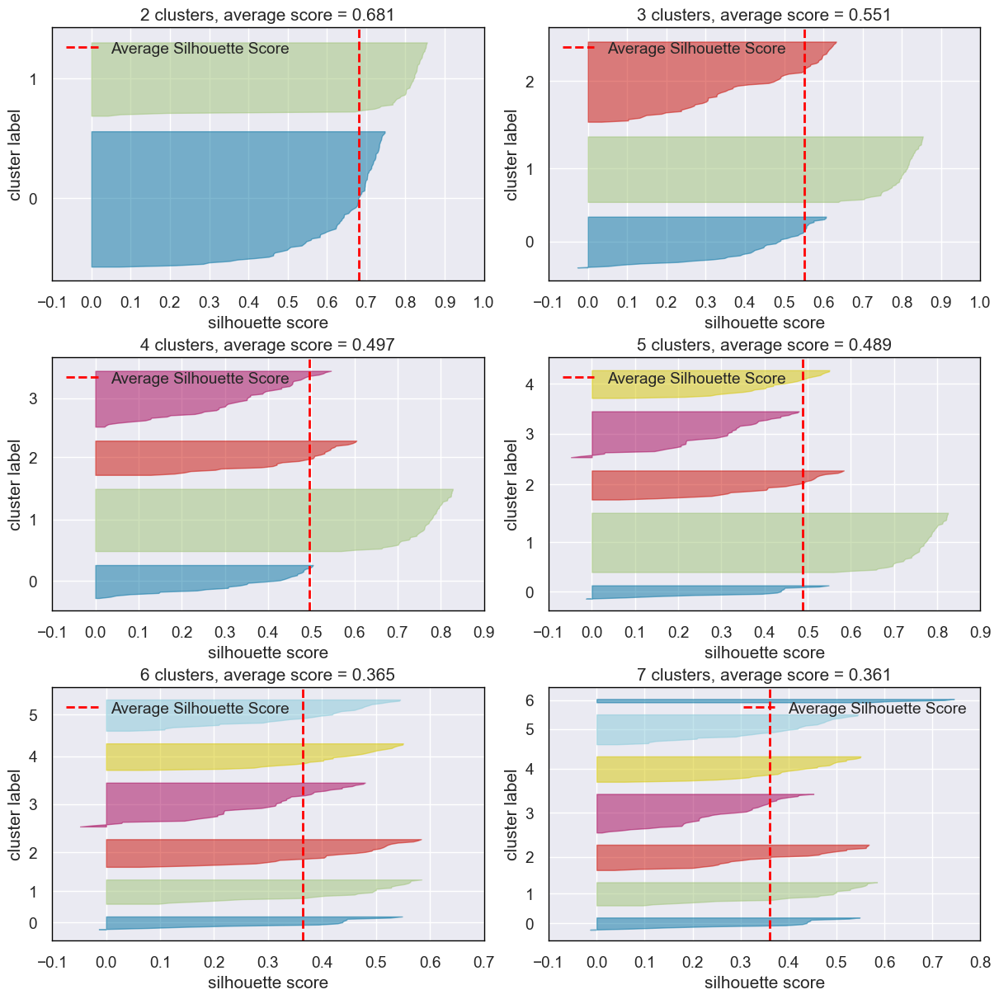

In [13]:
# Set figure layout
fig4 = plt.figure(constrained_layout=True, figsize=(12, 12))
gs = fig4.add_gridspec(3, 2)
ax411 = fig4.add_subplot(gs[0, 0])
ax412 = fig4.add_subplot(gs[0, 1])
ax413 = fig4.add_subplot(gs[1, 0])
ax421 = fig4.add_subplot(gs[1, 1])
ax422 = fig4.add_subplot(gs[2, 0])
ax423 = fig4.add_subplot(gs[2, 1])
ax_list = [ax411, ax412, ax413, ax421, ax422, ax423]

# Evaluate silhouette plots for 2 to 7 clusters
for i, n_clusters in enumerate(range(2, 8)):
    km = KMeans(n_clusters, n_init="auto", random_state=42)
    viz = SilhouetteVisualizer(km, ax=ax_list[i],
                               colors='yellowbrick')
    viz.fit(X)
    viz.finalize()
    viz.ax.set_title(
        f"{n_clusters} clusters, average score = {viz.silhouette_score_:0.3f}")
    viz.ax.set_xlabel("silhouette score")

##### **Explicació**

**Si sabemos que los datos estan mas o menos balanceados esperariamos ver que cada grupo tiene aprox mismo grosor. Miro cual tiene el score mas alto. Si miro el penultimo veo un pico a la izquierda, es score negativo que no tiene sentido pq es que estamos asignando  un grupo una instancia q no le pertenece.**

**Me quedaria el 2o pq tiene grupos de aprox mismo tamaño.**

The plot for **2 clusters** has the **highest average score** and shows one cluster with bigger size. We know that this is due to the grouping of 2 clusters in one big cluster, but without this information, **2 clusters would be a justified choice** based on the silhouette plots.

<div class="alert alert-block alert-info">
    <p><b>In fact, using the elbow method and silhouette scores, the best result is also 2 clusters!</b></p>
    <p>We already knew that this is a <i>slightly difficult</i> dataset for clustering.</p>
</div>

Other important conclusions from the plots:
- **4 and 5 clusters**. Some clusters show below-average silhouette scores (due to fluctuations in size of plots) and therefore these would be bad choices.

- **5, 6, and 7 clusters**. Some samples exhibit negative scores, indicating that these may have been assigned to the wrong cluster. These cases also have lower average scores.

So in the end, based on the silhouette plots and scores, sensible choices would be **2 or 3 clusters**.

## Other clustering algorithm examples
Here are some application examples of other families of clustering algorithms, without going into further details:
### Hierarchical clustering
Hierarchical clustering can be
- Agglomerative, initially considering each data point a cluster and grouping data based on similarity metrics (bottom-up approach)
- Divisive, initially considering a single cluster and separating distant points with each iteration (top-down approach).

In `sklearn.cluster`, `AgglomerativeClustering` recursively merges pairs of clusters according to a linkage measure.

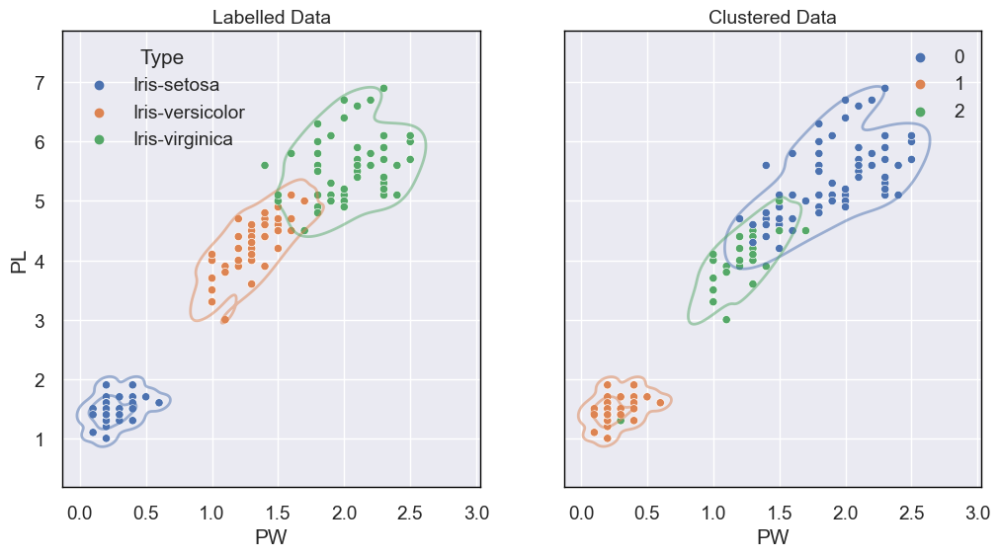

In [14]:
agg = AgglomerativeClustering(n_clusters=3,
                              metric='euclidean',
                              linkage='ward')
agg.fit(X_scaled)

# Figure to compare labels and clusters
fig5, (ax51, ax52) = plt.subplots(
    nrows=1, ncols=2,
    sharex='all', sharey='all',
    figsize=(12, 6))
plot_iris_clusters(ax51, data, 'PW', 'PL',
                   'Type', 'Labelled Data')
plot_iris_clusters(ax52, data, 'PW', 'PL',
                   agg.labels_,
                   'Clustered Data')

Let's compare the performance with respect to k-means:

In [15]:
print('Davies-Bouldin:\n',
      f' k-means  (3): {davies_bouldin_score(X_scaled, km3.labels_):0.4f}\n',
      f' hierarch (3): {davies_bouldin_score(X_scaled, agg.labels_):0.4f}\n')
print('Adjusted Mutual Information:\n',
      f' k-means  (3): {adjusted_mutual_info_score(enc_labels, km3.labels_):0.4f}\n',
      f' hierarch (3): {adjusted_mutual_info_score(enc_labels, agg.labels_):0.4f}')

Davies-Bouldin:
  k-means  (3): 0.8336
  hierarch (3): 0.8035

Adjusted Mutual Information:
  k-means  (3): 0.6552
  hierarch (3): 0.6713


Let's plot a dendrogram to understand better how the clusters are built. In this case, we need to use `linkage` and `dendrogram` from `scipy.hierarchy`:

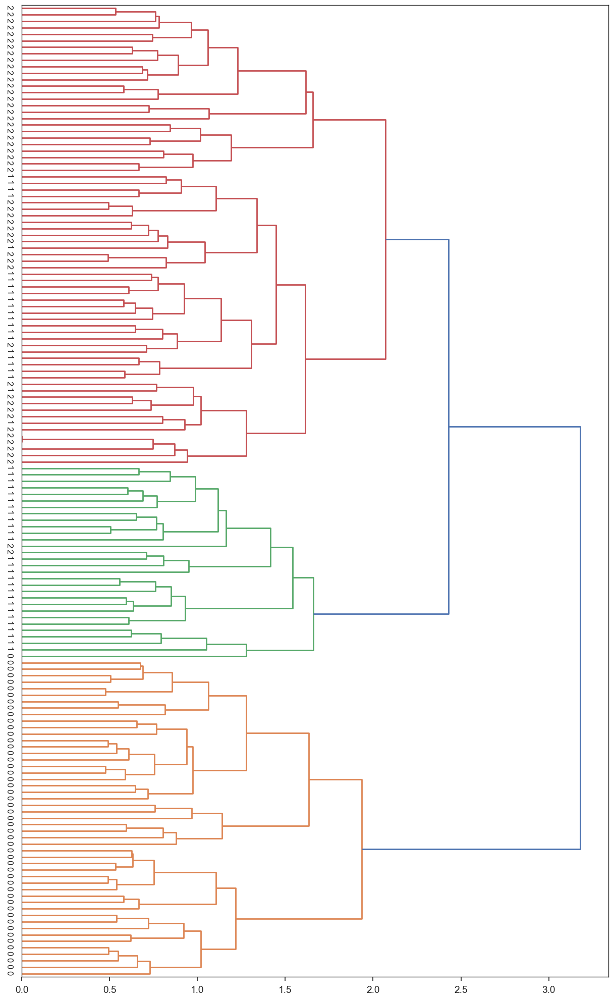

In [16]:
# Create hierarchical clusters
hier = linkage(X_scaled, 'ward')

# Compress the range of distances, just for viewing purposes
hier[:, 2] = hier[:, 2]**(0.35)

# Plot dendrogram
with sns.axes_style('ticks'):
    plt.figure(figsize=(15, 25))
    dendrogram(hier,
               labels=enc_labels,
               orientation="right",
               leaf_font_size=12,
               leaf_rotation=-90)
    plt.show()

### Density-based clustering
Density-based algorithms will focus on areas that have great density, in other words, a large amount of samples closely together.

DBSCAN and OPTICS are well-known density-based clustering algorithms:
- **DBSCAN** (Density-Based Spatial Clustering of Applications with Noise) finds core samples of high density and expands clusters from them. The central component to the DBSCAN is the concept of core samples, which are samples that are in areas of high density. A cluster is therefore a set of core samples, each close to each other (measured by some distance measure) and a set of non-core samples that are close to a core sample (but are not themselves core samples)
- **OPTICS** (Ordering Points To Identify the Clustering Structure) can be considered a generalization of DBSCAN that allows a **range of epsilon values**. While DBSCAN is good for data which contains clusters of similar density, OPTICS allows for variable density cluster extraction within a single dataset.

When performing DBSCAN, two parameters must be provided:
  - the **epsilon** value, which indicates some distance around a sample
  - the **minimum number of samples** (including the sample itself) that should be within the epsilon range for a point to be considered a core sample (which by definition, are always part of a cluster). Any sample that is not a core sample, and is at least epsilon in distance from any core sample, is considered an outlier by the algorithm.

**Higher minimum number of samples** or **lower epsilon** indicate **higher density necessary to form a cluster**. 
  
**The minimum number of samples controls how tolerant to noise** the method is, and **epsilon must be adjusted to the dataset** because if it is **too small most samples will not be clustered** (and therefore considered noise).
  
#### DBSCAN

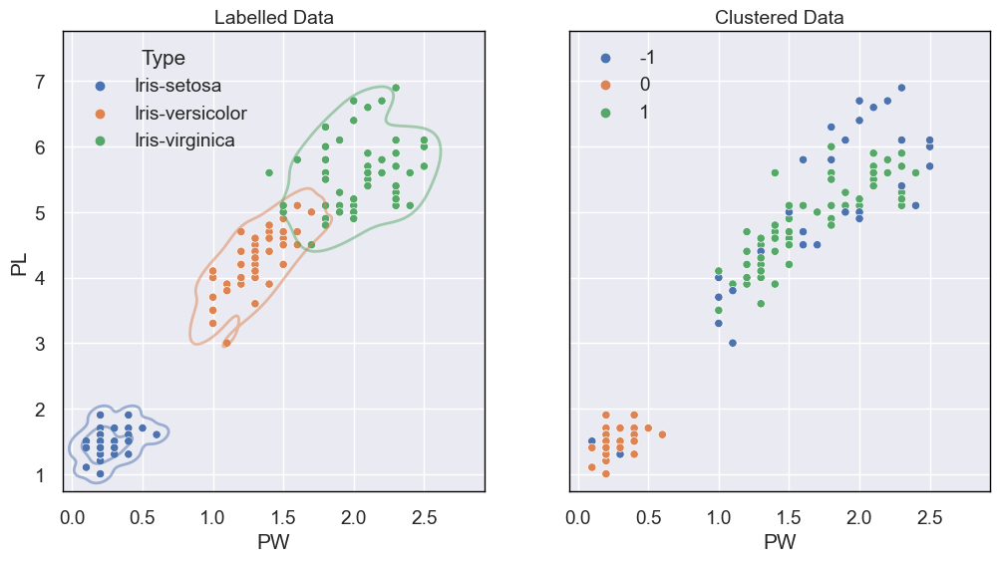

In [17]:
dbscan = DBSCAN(eps=0.7, min_samples=15)
dbscan.fit(X_scaled)

# Figure to compare labels and clusters
fig6, (ax61, ax62) = plt.subplots(
    nrows=1, ncols=2,
    sharex='all', sharey='all',
    figsize=(12, 6))
plot_iris_clusters(ax61, data, 'PW', 'PL',
                   'Type', 'Labelled Data')
plot_iris_clusters(ax62, data, 'PW', 'PL',
                   dbscan.labels_,
                   'Clustered Data',
                   False)

**DBSCAN returns 2 clusters!!**

<div class="alert alert-block alert-warning">
    <p>If we try to get <b>3 clusters</b>, the number of <b>outliers (label -1) increases a lot!</b></p><br>
    <p>You can try different values for <samp>eps</samp> and <samp>min_samples</samp> to see different results.</p>
</div>

#### OPTICS

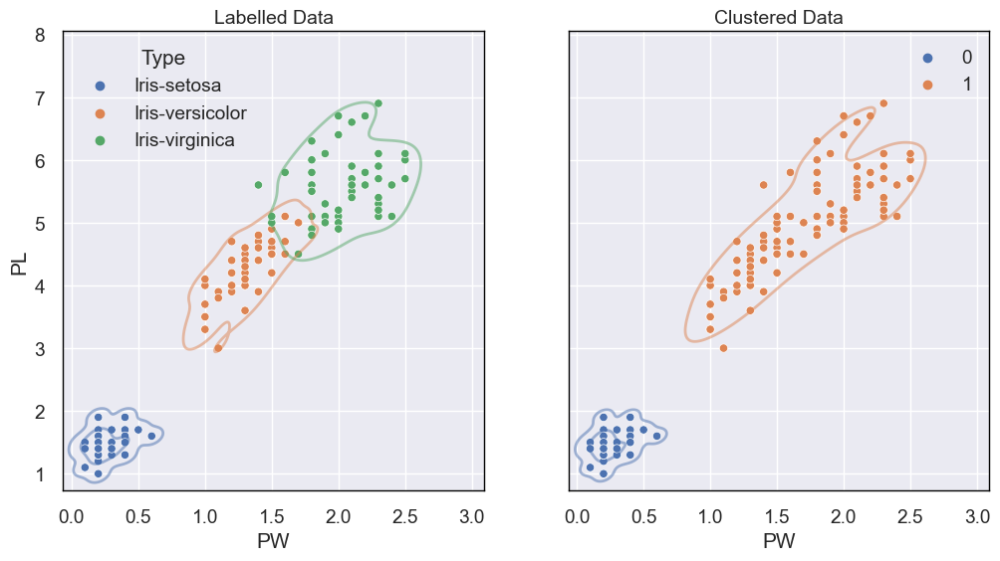

In [18]:
optics = OPTICS(min_samples=15, xi=.15, min_cluster_size=.15)
optics.fit(X_scaled)

# Figure to compare labels and clusters
fig7, (ax71, ax72) = plt.subplots(
    nrows=1, ncols=2,
    sharex='all', sharey='all',
    figsize=(12, 6))
plot_iris_clusters(ax71, data, 'PW', 'PL',
                   'Type', 'Labelled Data')
plot_iris_clusters(ax72, data, 'PW', 'PL',
                   optics.labels_,
                   'Clustered Data')

**OPTICS also returns 2 clusters!!** It's not really the best scenario (dataset) for distribution-based algorithms.

Let's try another least known alternative...

#### Mean Shift
This algorithm aims to discover blobs in a smooth density of samples, automatically setting the number of clusters. It is a centroid based algorithm, which works by updating candidates for centroids to be the mean of the points within a given region. These candidates are then filtered in a post-processing stage to eliminate near-duplicates to form the final set of centroids.

In other words,  Mean Shift _looks around_ and determines the direction where a sample must move to (where the cluster centroid likely is). However, it would be too expensive computationally to do so for all the samples. That is why the bandwidth helps, it simply defines an area around the samples where Mean Shift should look in order to determine the most probable path given density estimation. 

But what should this bandwidth value be? `estimate_bandwidth` estimates the _most suitable_ bandwidth based on your dataset.

The algorithm is not highly scalable, as it requires multiple nearest neighbor searches during the execution of the algorithm, but is guaranteed to converge.

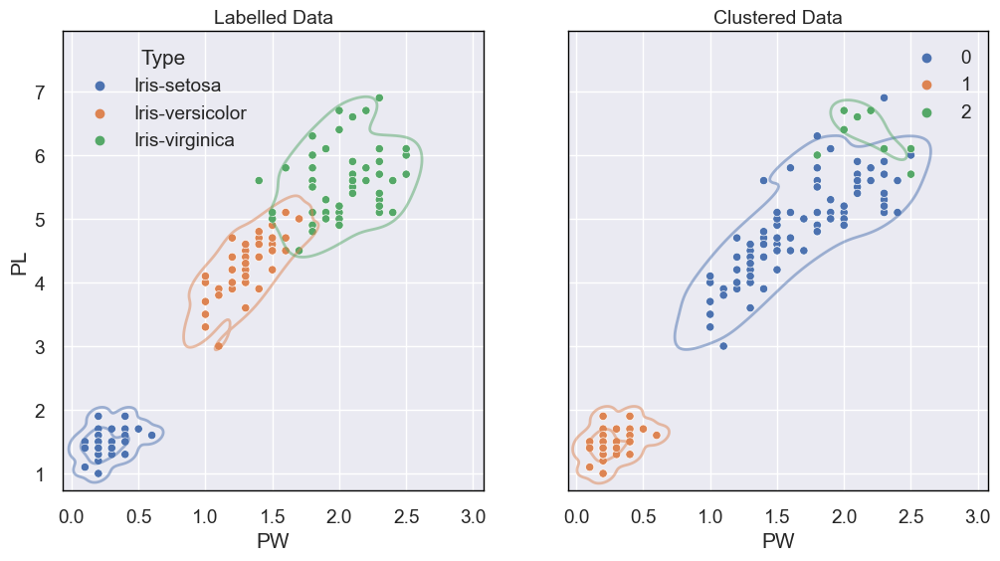

In [19]:
bandwidth = estimate_bandwidth(X, quantile=0.35, n_samples=30, random_state=42)
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(X_scaled)

# Figure to compare labels and clusters
fig8, (ax81, ax82) = plt.subplots(
    nrows=1, ncols=2,
    sharex='all', sharey='all',
    figsize=(12, 6))
plot_iris_clusters(ax81, data, 'PW', 'PL',
                   'Type', 'Labelled Data')
plot_iris_clusters(ax82, data, 'PW', 'PL',
                   ms.labels_,
                   'Clustered Data')

### Distribution-based clustering

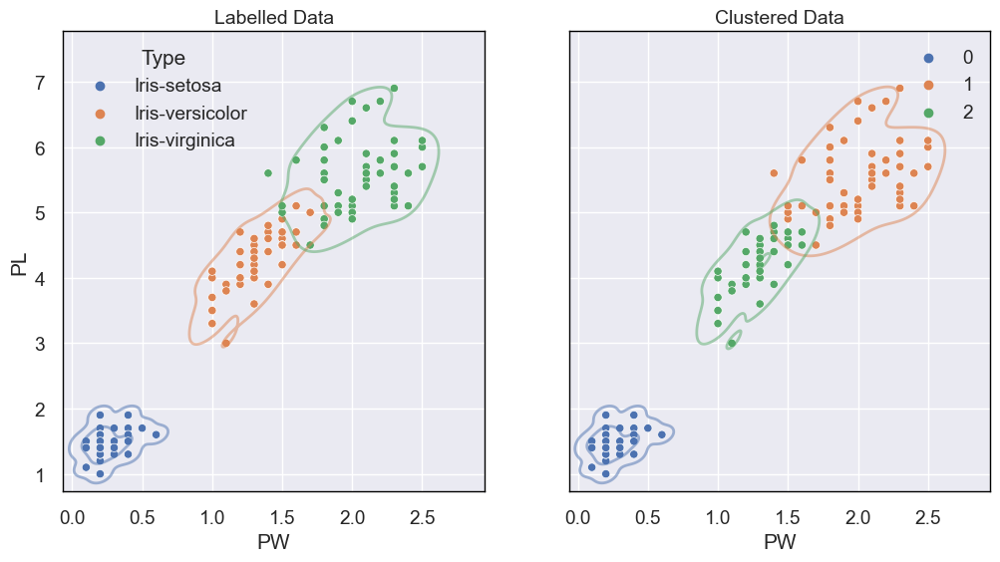

In [20]:
gmm3 = GaussianMixture(n_components=3, covariance_type='full')
gmm3.fit(X_scaled)
gmm3_labels = gmm3.predict(X_scaled)

# Figure to compare labels and clusters
fig9, (ax91, ax92) = plt.subplots(
    nrows=1, ncols=2,
    sharex='all', sharey='all',
    figsize=(12, 6))
plot_iris_clusters(ax91, data, 'PW', 'PL',
                   'Type', 'Labelled Data')
plot_iris_clusters(ax92, data, 'PW', 'PL',
                   gmm3_labels,
                   'Clustered Data')

**When setting the number of clusters to 3, gaussian mixture models perform quite well!**


Let's compare with k-means:

In [21]:
print('Davies-Bouldin:\n',
      f' k-means (3): {davies_bouldin_score(X_scaled, km3.labels_):0.4f}\n',
      f' gmm (3):     {davies_bouldin_score(X_scaled, gmm3_labels):0.4f}\n')
print('Adjusted Mutual Information:\n',
      f' k-means  (3): {adjusted_mutual_info_score(enc_labels, km3.labels_):0.4f}\n',
      f' gmm (3):      {adjusted_mutual_info_score(enc_labels, gmm3_labels):0.4f}')

Davies-Bouldin:
  k-means (3): 0.8336
  gmm (3):     1.0809

Adjusted Mutual Information:
  k-means  (3): 0.6552
  gmm (3):      0.8984


Clearly GMM performs better than k-means, but as we saw before, **it's not very clear that we would choose a number of clusters equal to three in this dataset** without previous knowledge.

Let's perform the elbow method again, now for GMM. The results depend a lot on the initialization, so we run the experiment several times (`n_trials`) and average the curves to assess the elbow:

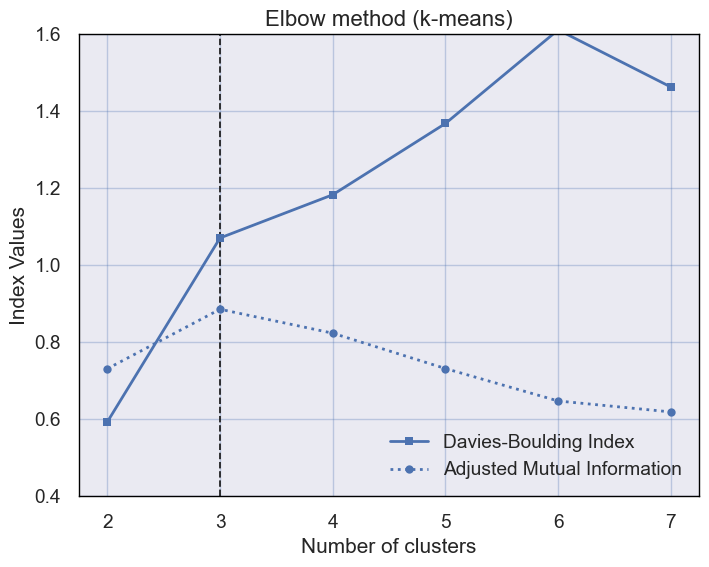

In [22]:
# Arrays to store/plot the scores
n_clusters = np.arange(2, 8)
db_scores = np.zeros(np.size(n_clusters))
ami_scores = np.zeros(np.size(n_clusters))
n_trials = 40

# encode classes into numbers (for AMI calculation)
encoder = LabelEncoder()
enc_labels = encoder.fit_transform(y)

# calculate scores for increasing number of clusters
for i in range(n_trials):
    for n in n_clusters:
        gmm_labels = GaussianMixture(
            n_components=n, covariance_type='full').fit_predict(X_scaled)
        db_scores[n-n_clusters[0]
                  ] += davies_bouldin_score(X_scaled, gmm_labels)/n_trials
        ami_scores[n-n_clusters[0]
                   ] += adjusted_mutual_info_score(enc_labels, gmm_labels)/n_trials

# plot results (changing seaborn style for this figure only)
fig10, ax10 = plt.subplots(figsize=(8, 6))
ax10.plot([3, 3], [0.4, 1.6], 'k--', linewidth=1.25)
ax10.plot(n_clusters,
          db_scores,
          's-',
          color=cycle_colors[0],
          label='Davies-Boulding Index')
ax10.plot(n_clusters,
          ami_scores,
          'o:',
          color=cycle_colors[0],
          label='Adjusted Mutual Information')

# Customize axis limits and colors, add legends outside
ax10.set_title('Elbow method (k-means)', size=16)
ax10.set_ylabel('Index Values')
ax10.set_ylim(.4, 1.6)
ax10.set_xlabel('Number of clusters')
ax10.grid(color=cycle_colors[0], alpha=0.3)
ax10.legend()

<br>
<br>
<div class="alert alert-block alert-success", style="border-radius: 70px">
    <h1 style="text-align: center; margin-left:4cm; margin-top:0.5cm; margin-bottom:0.5cm; font-size:48px">Exercises</h1>
</div>
<br>
<div>
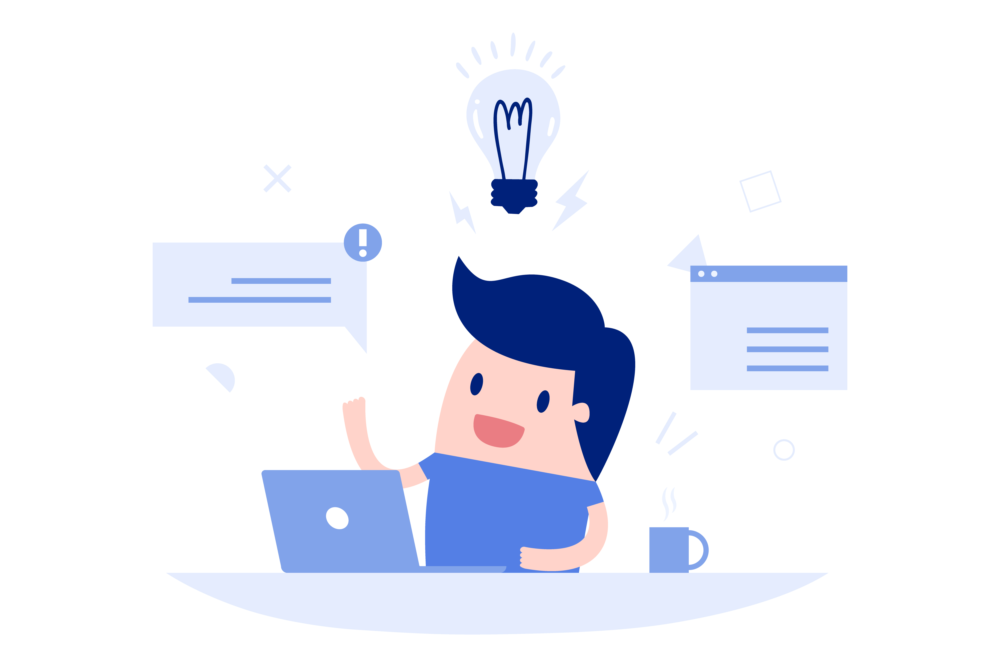
</div>

#### Explicació
Agulles amb electrodes multicanal als q no responen al tractament.

<h2 style="margin-top:0.5cm; margin-bottom:0.5cm; color: green">Exercise 1. The HFO dataset. Exploratory data analysis</h2>
    
This dataset contains information on high-frequency oscillations (HFOs) detected on intracranial EEG recordings of 10 pediatric patients suffering from refractory epilepsy. 

The [SGM algorithm](https://doi.org/10.1088/1741-2552/ab8345) used to detect HFOs is implemented in Python and [freely-available](https://github.com/cmiglio/epyHFO).


The different features associated with each detected HFO are:
- **id**, the patient ID 
- **ch**, channel where the amplitude of the HFO is the maximal
- **soz**, indicates if _ch_ is located in the seizure onset zone (SOZ) or not --> GROUND TRUTH (the doctor said it but not essentially good at all)
- **amp**, HFO amplitude in _ch_ (maximum value of the Hilbert envelope)
- **freq**, HFO frequency in _ch_ (inverse of the average oscillation period)

To start, load the dataset in the file `240317-06-hfos.csv` and perform the exploratory data analysis.

<div class="alert alert-block alert-info">
    <p><b>Location in the SOZ will be our ground truth!</b></p>
    <p> This is not 100% accurate, as physiological HFOs can happen in the SOZ, and some pathological HFOs could also propagate outside the SOZ, but it's enough at this level and the best we can do for now<p>
    <div class="alert alert-block alert-info", style=" border: 0px; background-color: #EBF5FB">
    <p><i>Probably we will have more to say here when the article gets published!</p>
</div>
</div>

<div class="alert alert-block alert-warning">
    <p><b>Depending on the distribution of the features, we can consider <i>log-scaling</i> to tackle possible skewness before standardisation.</b></p>
    <p>Add new columns to the dataframe if necessary!</p>
</div>

**To complete this exercise:**
1. Explore the features of a patient (copy a part of the dataframe and leave the whole dataset for later, as plotting can be slow), log-transform them if necessary, add a one-hot encoded variable based on the _soz_ feature.
1. Explore the distribution or pair plots to look for possible relationship between variables, number of possible clusters, etc. (try with and without standardisation).
1. Apply everything you have tried (one-hot encoding, log-transforming, standardisation) to the whole dataframe.

<div class="alert alert-block alert-info">
    Use as many additional markdown and code cells as you need to obtain and comment your results.
</div>

In [23]:
df_hfo = pd.read_csv("Data/240317-06-hfo.csv")
df_hfo_copy = df_hfo.copy()
#df_hfo.head()

In [24]:
df_hfo_PAT1 = df_hfo_copy[df_hfo_copy['id']=='PAT_1']
df_hfo_PAT1['soz_num'] = np.where(df_hfo_PAT1['soz']=='Yes', 1, 0)

df_hfo_PAT1['log_freq'] = np.log10(df_hfo_PAT1['freq'])
df_hfo_PAT1['log_amp'] = np.log10(df_hfo_PAT1['amp'])
#df_hfo_PAT1

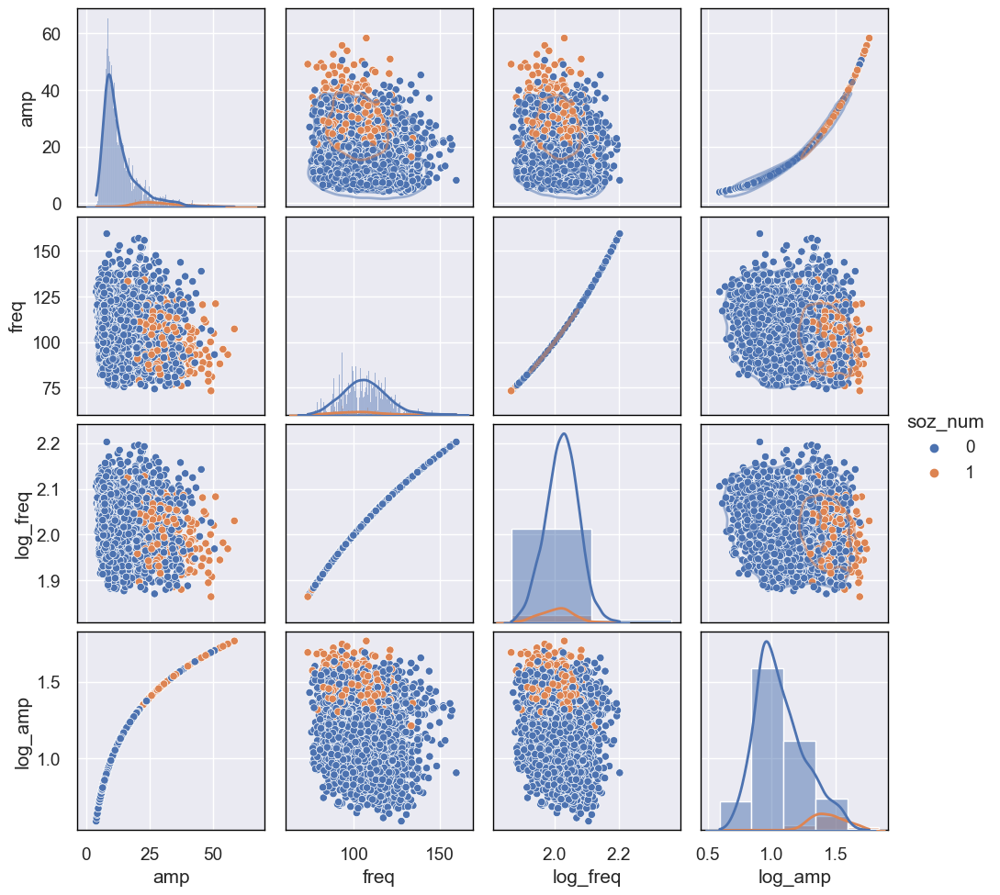

In [25]:
# Custom pairplot
g = sns.pairplot(df_hfo_PAT1, hue="soz_num", grid_kws={'despine': False})
g.map_upper(sns.kdeplot, levels=5, alpha=0.5)
g.map_diag(sns.histplot, binwidth=0.25, kde=True, fill=True);

#### 2. Explore the distribution or pair plots to look for possible relationship between variables, number of possible clusters, etc. (try with and without standardisation).

In [26]:
# Divide dataset into features and target
X = df_hfo_PAT1[['amp', 'freq', 'log_freq', 'log_amp']]
y = df_hfo_PAT1[['soz_num']]

In [27]:
# Feature scaled
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

In [28]:
# Convert to dataframe
df_hfo_PAT1_st = pd.DataFrame(X_scaled,columns=X.columns)
df_hfo_PAT1_st = pd.concat([df_hfo_PAT1_st, y], axis=1)

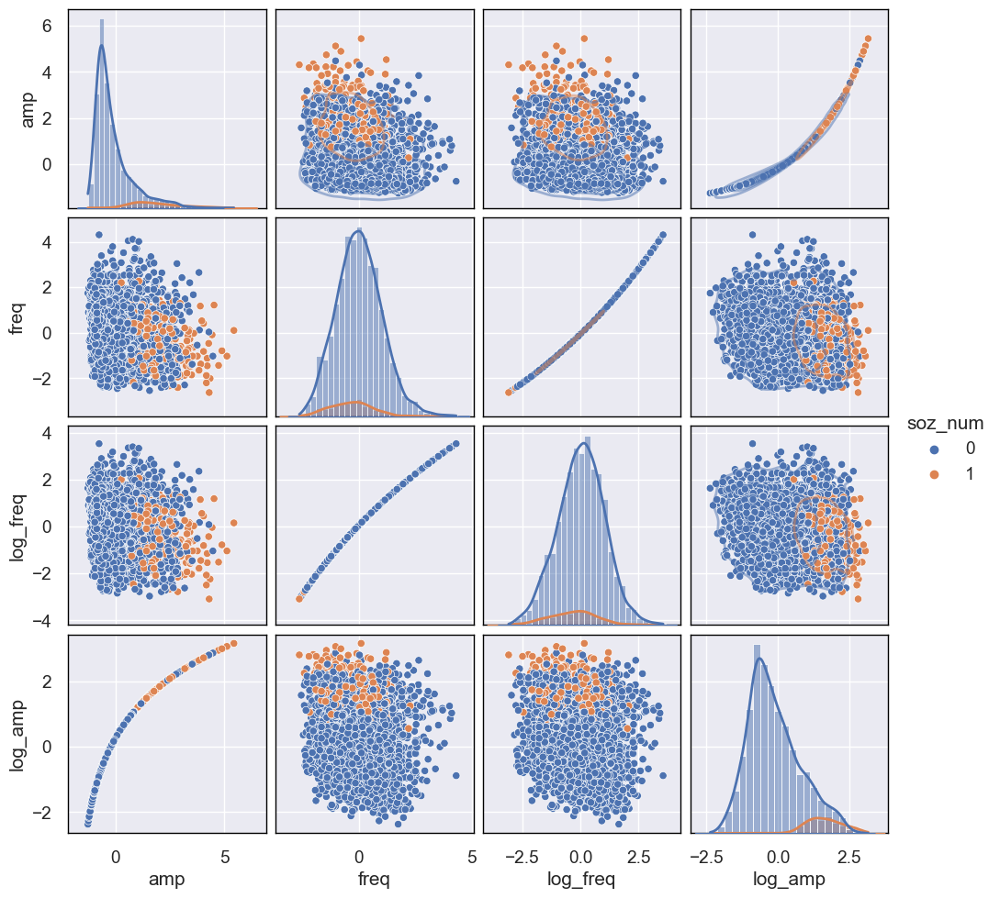

In [29]:
# Custom pairplot
g = sns.pairplot(df_hfo_PAT1_st, hue="soz_num", grid_kws={'despine': False})
g.map_upper(sns.kdeplot, levels=5, alpha=0.5)
g.map_diag(sns.histplot, binwidth=0.25, kde=True, fill=True);

#### 3. Apply everything you have tried (one-hot encoding, log-transforming, standardisation) to the whole dataframe.

In [30]:
# One-hot encoding
df_hfo['soz_num'] = np.where(df_hfo['soz']=='Yes', 1, 0)

# log-transformation
df_hfo['log_freq'] = np.log10(df_hfo['freq'])
df_hfo['log_amp'] = np.log10(df_hfo['amp'])

In [31]:
# Divide dataset into features and target
X = df_hfo[['amp', 'freq', 'log_freq', 'log_amp']]
y = df_hfo[['soz_num']]

In [32]:
# Feature scaled
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

In [33]:
# Convert to dataframe
df_hfo_st = pd.DataFrame(X_scaled,columns=X.columns)
df_hfo_st = pd.concat([df_hfo['id'], df_hfo_st, y], axis=1)

<hr style="margin-top:0.5cm; margin-bottom:0.5cm; border-top: 9px double #BBDDBB; background-color: #FFF"></hr><br>
<h2 style="margin-top:0.5cm; margin-bottom:0.5cm; color: green">Exercise 2. Clustering pathologic and non-pathologic HFOs</h2>

HFOs have emerged as a **promising clinical biomarker for presurgical evaluation in childhood epilepsy**.

They are commonly classified as **ripples (80 to 200 Hz)** and **fast ripples (200 to 500 Hz)**. Ripples are **less specific** and not so directly associated with epileptogenic activity **because they can be of physiological and pathological origin**.

<span style="color: #2874A6">Here at the UPC we have developed a methodology to **distinguish between both types of HFOs in the ripple band** without spatial constraints, and to improve the evaluation of the epileptogenic zone. This _yet-to-be-published_ study constitutes a proof‐of‐concept for a novel modelling approach evaluated in ten pediatric patients with focal epilepsy, with seizure onset zones defined by clinicians during presurgical evaluation.</span>

<span style="color: #2874A6">We have proposed **individual analysis on a subject-by-subject basis**: fitting a **Gaussian mixture model** to each patient based on the combination of specific features followed by the **estimation of the physiological and pathological ripple subpopulations (2 clusters)**.</span>

<span style="color: #2874A6">Our results show that **pathological ripples can be identified**. The most statistically significant features are **amplitude** and **instantaneous frequency**. Features differ considerably among patients showing within-subject variability, suggesting that **individual models are more appropriate than a traditional whole-population approach**.</span>

**To complete this exercise:**
1. Fit a GMM (2 clusters, full covariance matrix) to the HFOs of one patient (for example _PAT_2_, _IGS_ or _PMR_)
  1. Plot the results
  1. Evaluate the performance of the clustering (scores or silhouette plots, or both, you choose!)
1. Fit a similar GMM to patient _PAT_07_ (or _PAT_12_, or _PAT_03_) and compare the results with the previous example
1. Try and code a loop to apply the same code to all other patients!

<div class="alert alert-block alert-warning">
    <p><b>Bonus points</b> will be awarded if the <b>plots help to summarize</b> all this information: <i>think of a "composite" figure/plot per each patient instead of many plots and prints</i>.</p>
</div>

<div class="alert alert-block alert-info">
    Use as many additional markdown and code cells as you need to obtain and comment your results.
</div>

In [34]:
from sklearn.metrics import silhouette_samples, silhouette_score
    
def calculate_plot_silhouette(X_scaled, gmm_labels, ax):
    # Compute silhouette scores
    silhouette_avg = silhouette_score(X_scaled, gmm_labels)
    sample_silhouette_values = silhouette_samples(X_scaled, gmm_labels)

    # Initialize y_lower for the silhouette plot
    y_lower = 10

    # Loop over clusters to plot each silhouette plot
    for i in range(2):  # Assuming you have 2 clusters (change this as needed)
        # Extract silhouette values for the current cluster
        cluster_silhouette_values = sample_silhouette_values[gmm_labels == i]
        cluster_silhouette_values.sort()
        size_cluster_i = cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        # Choose color for the cluster
        color = plt.cm.viridis(float(i) / 2)

        # Fill silhouette plots
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                         0, cluster_silhouette_values,
                         facecolor=color, edgecolor=color, alpha=0.7)

        # Label cluster numbers at the middle of the silhouette plots
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Update y_lower for the next plot
        y_lower = y_upper + 10

    # Add title, labels, and vertical line for average silhouette score
    ax.set_title("Silhouette Plot for GMM Clustering")
    ax.set_xlabel("Silhouette coefficient values")
    ax.set_ylabel("Cluster label")
    ax.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax.set_yticks([])  # Clear the y-axis labels / ticks

    # Display average silhouette score
    ax.text(0.5, 0.95, f"Average Silhouette Score: {silhouette_avg:.3f}", transform=ax.transAxes,
            horizontalalignment='center', verticalalignment='top', fontsize=10, fontweight='bold')

In [35]:
# Plotting functions
def plot_hfo_clusters(ax, data, x, y, hue, title, *args):
    if not args or (args and args[0]):
        sns.kdeplot(data=data,
                    x=x, y=y,
                    hue=hue,
                    alpha=0.5,
                    levels=2,
                    palette="deep",
                    ax=ax)
    sns.scatterplot(data=data,
                    x=x, y=y,
                    hue=hue,
                    palette="deep",
                    ax=ax)
    ax.set_title(title, size=14)
    
def compare_labels_clusters(dataframe, labels, ax1, ax2):
    plot_hfo_clusters(ax11, dataframe, 'log_amp', 'log_freq', 'soz_num', 'Labelled Data')
    plot_hfo_clusters(ax12, dataframe, 'log_amp', 'log_freq', labels, 'Clustered Data')

### Patient 2

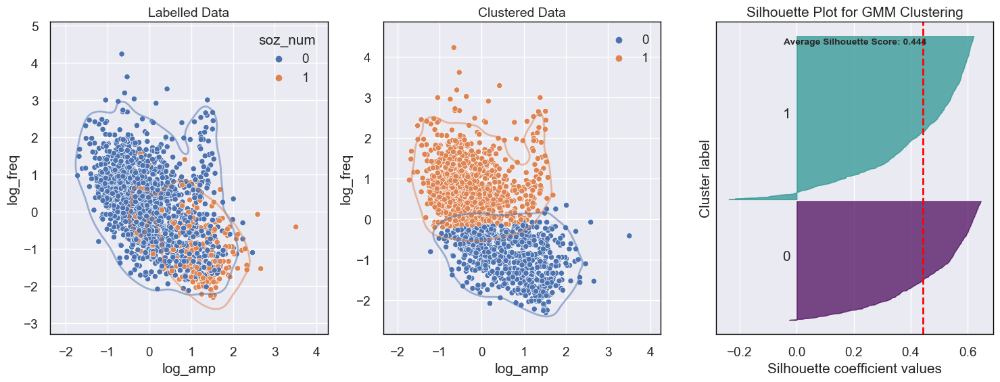

In [36]:
# Patient 2
df_hfo_st_PAT1 = df_hfo_st[df_hfo_st['id']=='PAT_2'].copy()
X_scaled_PAT1 = df_hfo_st_PAT1[['amp', 'freq', 'log_freq', 'log_amp']]

# GMM
gmm2_1 = GaussianMixture(n_components=2, covariance_type='full')
gmm2_1.fit(X_scaled_PAT1)
gmm2_labels_1 = gmm2_1.predict(X_scaled_PAT1)

fig, (ax11, ax12, ax13) = plt.subplots(
    nrows=1, ncols=3,
    figsize=(18, 6))

# Clusters plot
compare_labels_clusters(df_hfo_st_PAT1, gmm2_labels_1, ax11, ax12)

# Silhouette plot and score
calculate_plot_silhouette(X_scaled_PAT1, gmm2_labels_1, ax13)

### Patient 7

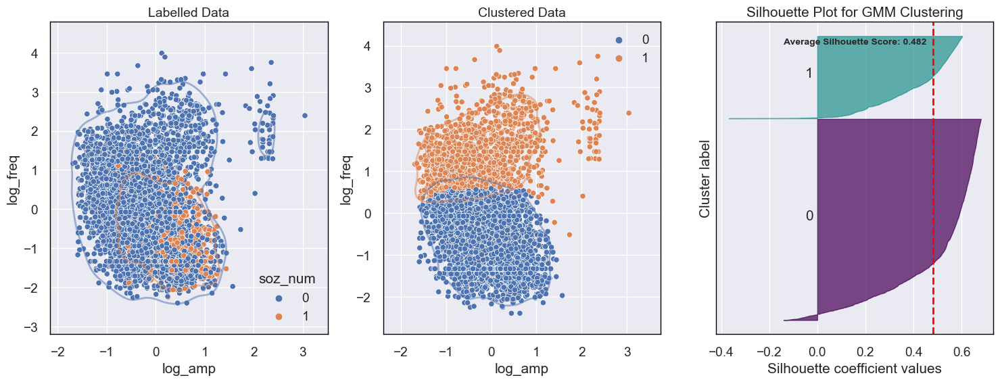

In [37]:
# Patient 7
df_hfo_st_PAT7 = df_hfo_st[df_hfo_st['id']=='PAT_7'].copy()
X_scaled_PAT7 = df_hfo_st_PAT7[['amp', 'freq', 'log_freq', 'log_amp']]

# GMM
gmm2 = GaussianMixture(n_components=2, covariance_type='full')
gmm2.fit(X_scaled_PAT7)
gmm2_labels = gmm2.predict(X_scaled_PAT7)

fig, (ax11, ax12, ax13) = plt.subplots(
    nrows=1, ncols=3,
    figsize=(18, 6))

# Clusters plot
compare_labels_clusters(df_hfo_st_PAT7, gmm2_labels, ax11, ax12)

# Silhouette plot and score
calculate_plot_silhouette(X_scaled_PAT7, gmm2_labels, ax13)

<span style='color:blue'>
Comparing the results from patient 2 with the results from patient 7, it is seen that patient 2 provides a more balanced data between if channel is located in the seizure onset zone (SOZ) or not. Since the size between each cluster in the Silhouette plot is more similar. However, what they have both in common is that in both patients the GMM has predicted some targets in a bad way, it is seen because of the negative values in the Silhouette plot.

### All patients

In [38]:
ids = df_hfo_st['id'].unique()

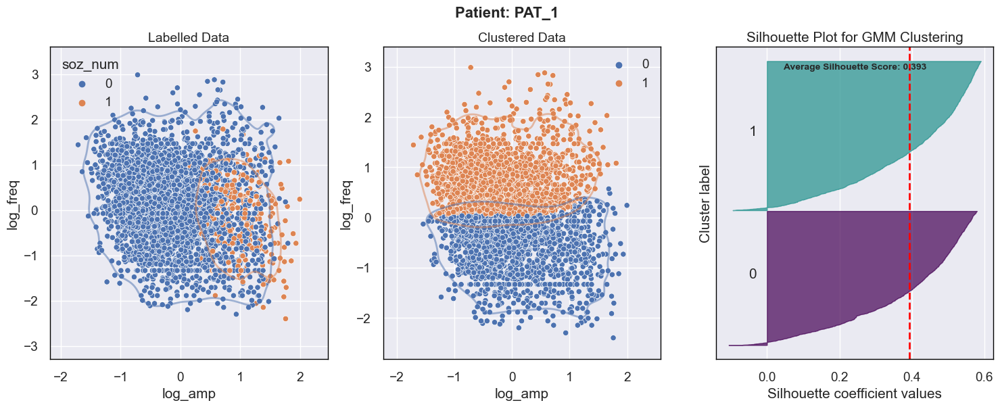

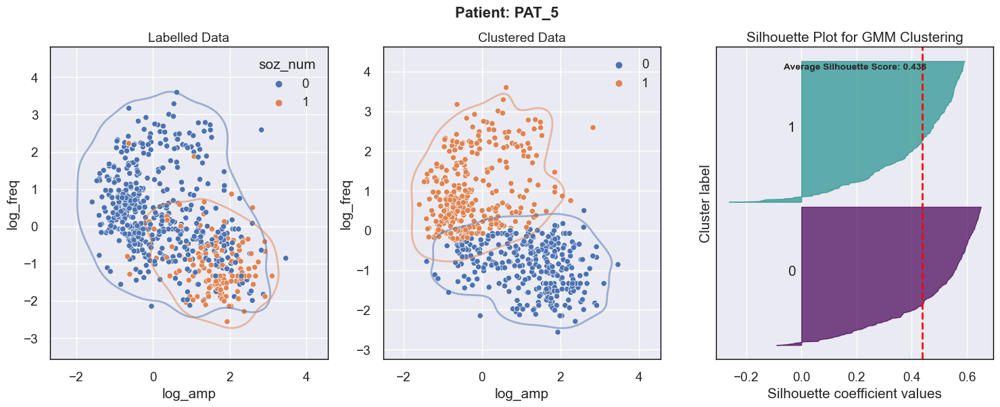

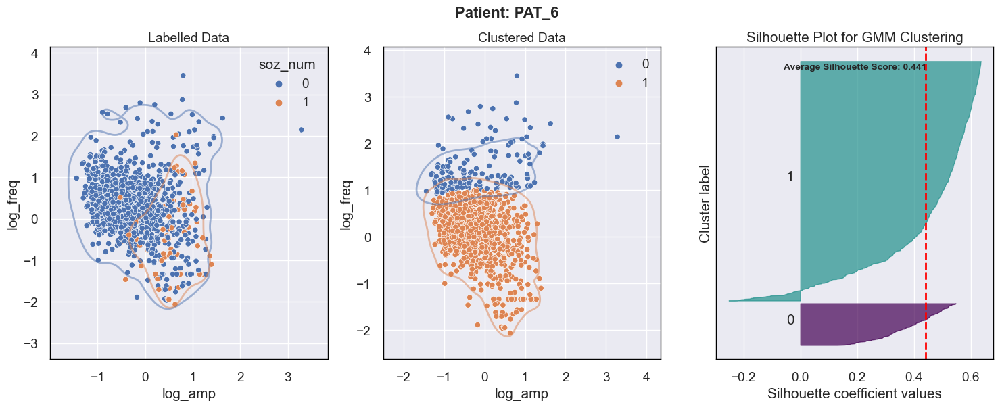

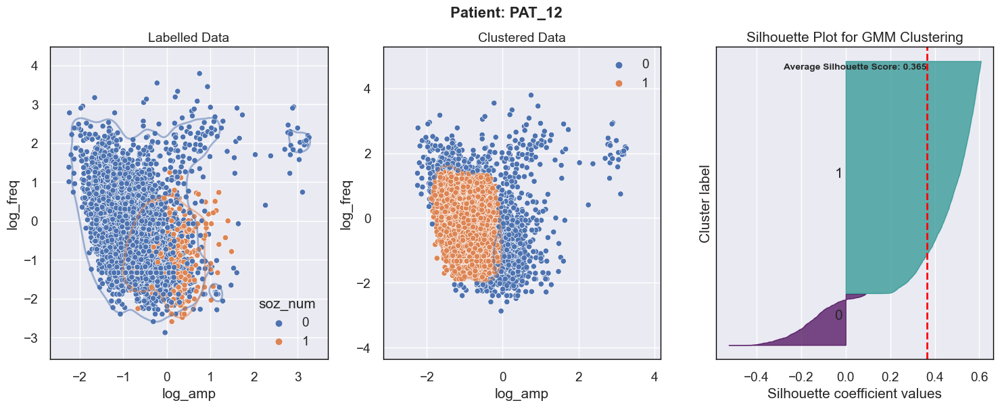

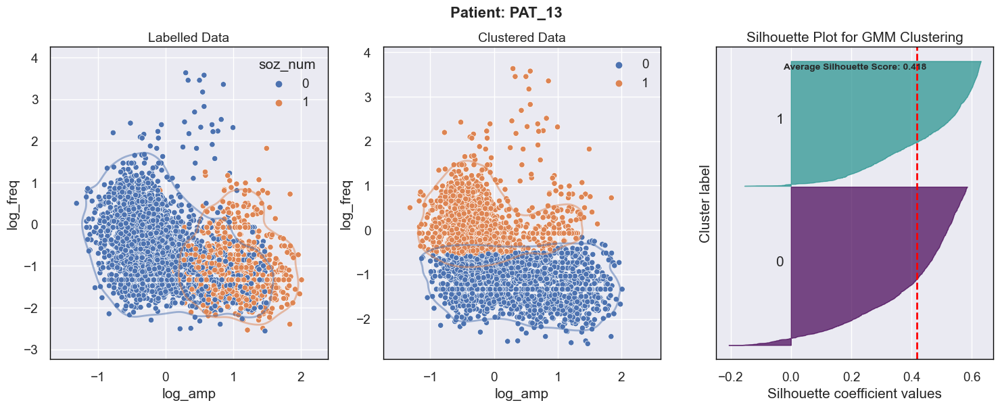

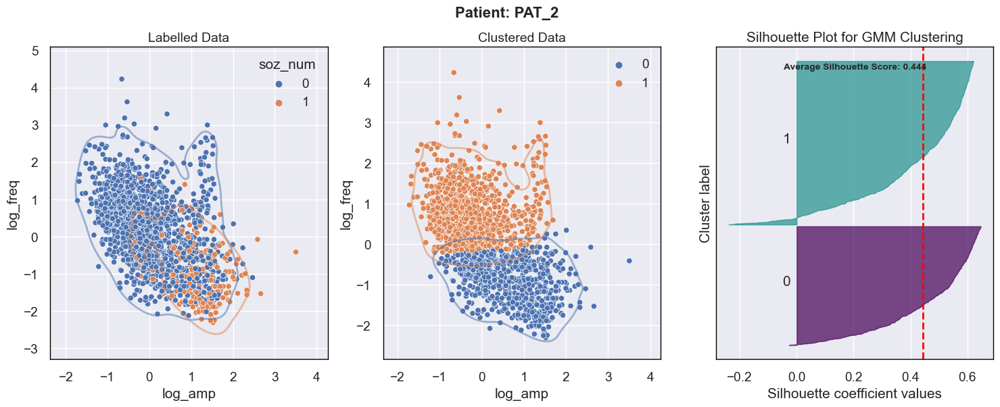

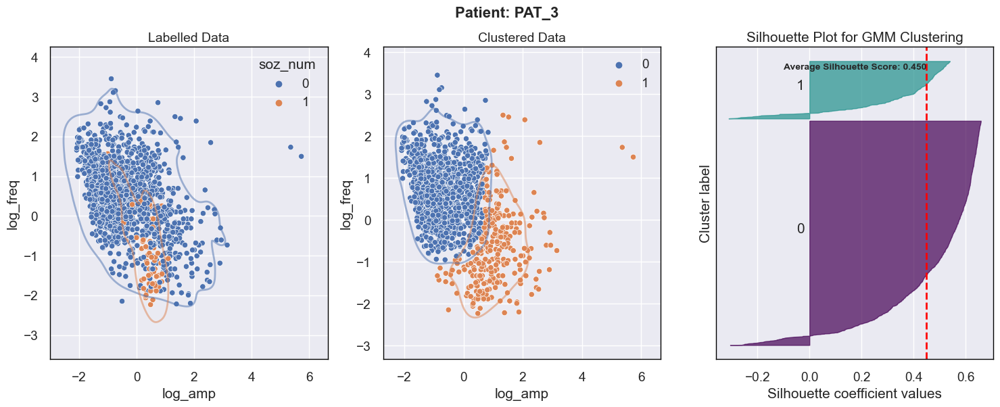

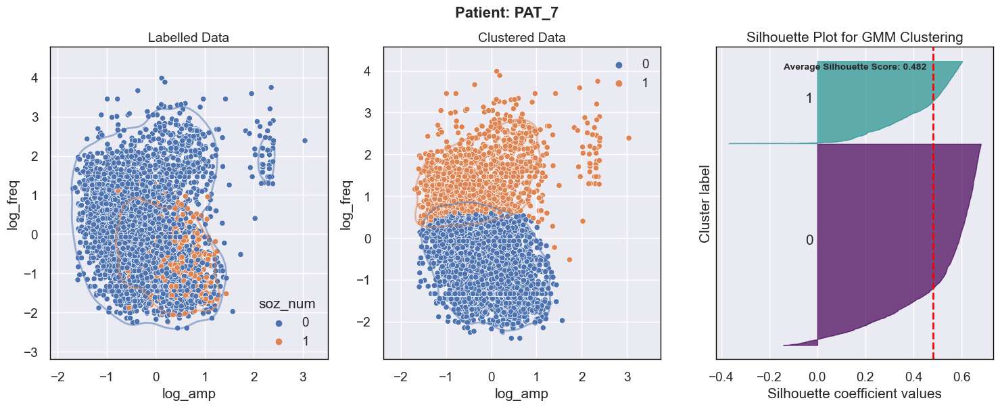

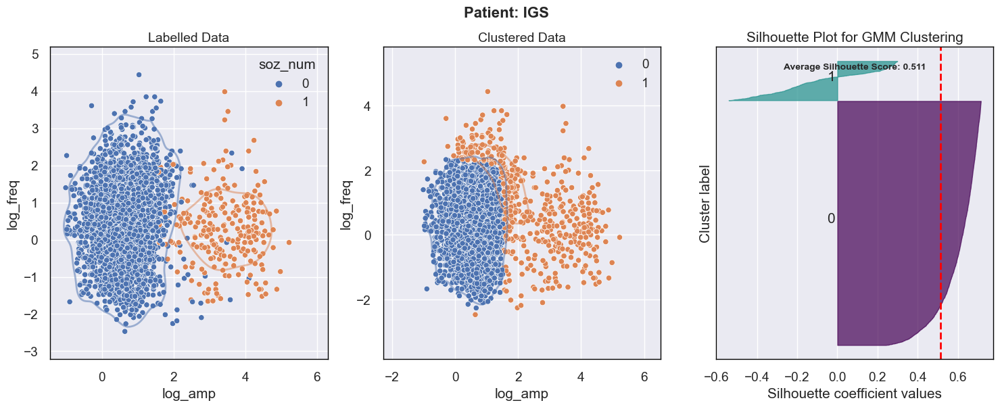

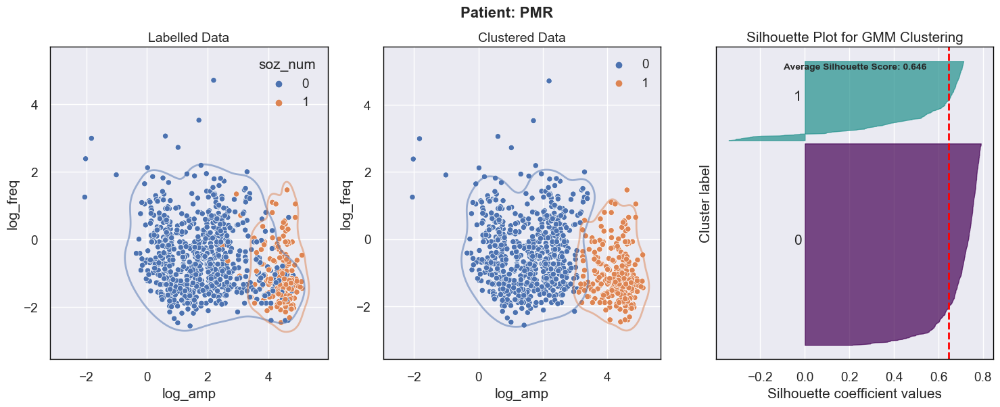

In [39]:
for index, patient in enumerate(ids):
    df_hfo_st_pat = df_hfo_st[df_hfo_st['id']==patient].copy()
    X_scaled_pat = df_hfo_st_pat[['amp', 'freq', 'log_freq', 'log_amp']]

    # GMM
    gmm2 = GaussianMixture(n_components=2, covariance_type='full')
    gmm2.fit(X_scaled_pat)
    gmm2_labels = gmm2.predict(X_scaled_pat)
    
    fig, (ax11, ax12, ax13) = plt.subplots(nrows=1, ncols=3,figsize=(18, 6))
    fig.suptitle("Patient: "+patient, fontsize=16, fontweight='bold')
    
    # Clusters plot
    compare_labels_clusters(df_hfo_st_pat, gmm2_labels, ax11, ax12)

    # Silhouette plot and score
    calculate_plot_silhouette(X_scaled_pat, gmm2_labels, ax13)

<span style='color:blue'>
It is showed that is challenging to classify correctly the data into the correspondent cluster, since all silhouette plots have negative values, indicating the wrong classified data. Additionally, it's evident that in almost all patients, target variable is unbalanced, seen in the difference between Silhouette plot clusters size on each subject. However, patient 2, 3 and 5 are notably the most balanced ones.

The average Silhouette score is a metric used to calculate the goodness of a clustering technique. Its value ranges from -1 to 1.

- 1: Means clusters are well apart from each other and clearly distinguished.
- 0: Means clusters are indifferent, or we can say that the distance between clusters is not significant.
- -1: Means clusters are assigned in the wrong way.

Examining the average Silhouette scores ranging from 0.36 to 0.65, it is evident that clusters are not misassigned at all, but rather exhibit reasonable cohesion and separation. This suggests that the clustering technique used performs quite well but not completely.

<hr style="margin-top:0.5cm; margin-bottom:0.5cm; border-top: 9px double #BBDDBB; background-color: #FFF"></hr><br>
<h2 style="margin-top:0.5cm; margin-bottom:0.5cm; color: green">Exercise 3. Tailoring the clusters (according to some objective)</h2>

In the previous exercise, it's clear that HFOs are difficult to cluster into two groups for some patients. Pathologic HFOs should exhibit higher amplitudes and slighly lower frequencies, but this is difficult to see in patient _PAT_3_ and _PAT_7_. The particular nature of this problem makes indexes such as the Davies-Bouldin or adjusted mutual information not suitable for this application.

However, GMM is a soft-clustering algorithm, meaning that we can use the membership probability to decide with HFOs belong to a cluster or not. We can obtain this probability using `gmm.predict_proba()`, which  returns a matrix of size `[n_samples, n_clusters]` which measures the probability that any point belongs to the given cluster:
```python
hfo_gmm_proba = hfo_gmm.predict_proba(hfo_X_scaled)
```
We can restrict the number of HFOs that we consider **true pathologic** by **increasing the probability threshold of belonging to the high-amplitude cluster**. To know which column corresponds to the highest amplitude cluster (it changes for each patient, you have probably seen it in the results of the previous exercise) we can use the information of `gmm.means_`:
```python
amp_proba = hfo_gmm_proba[:, np.argmax(hfo_gmm.means_[:, 0])]  # 0 is the first feature (column) in hfo_X_scaled
```

Using this, we can add new columns to the dataframe that indicate membership to the high-amplitude cluster and compare it to the _ground truth_ given by the `in_soz` column, for example drawing a confusion matrix (and even a classification report matrix).

**To complete this exercise:**
1. Add columns to the HFO dataframe that indicate membership to the high-amplitude cluster for different probabilities (for example, 0.5, 0.8, 0.95, or others).
1. Plot the results and evaluate the performance of the clustering in terms of TNR (True Negative Rate) and TPR (True Positive Rate) and other related measures.

<div class="alert alert-block alert-info">
Remember that the objective in this exercise is to restrict the membership probability to each cluster to assess what happens to physiologic and pathologic HFOs (with respect to the ground truth), and how we can use that to our advantage to provide information to doctors.
</div>

<div class="alert alert-block alert-info">
    Use as many additional markdown and code cells as you need to obtain and comment your results.
</div>

In [40]:
# Define the probability thresholds
probability_thresholds = [0.3, 0.5, 0.8, 0.95]

# Iterate over unique patient IDs
ids = df_hfo_st['id'].unique()

for patient in ids:
    df_hfo_st_pat = df_hfo_st[df_hfo_st['id'] == patient].copy()
    X_scaled_pat = df_hfo_st_pat[['amp', 'freq', 'log_freq', 'log_amp']]

    # GMM
    gmm2 = GaussianMixture(n_components=2, covariance_type='full')
    gmm2.fit(X_scaled_pat)
    hfo_gmm_proba = gmm2.predict_proba(X_scaled_pat)
    amp_proba = hfo_gmm_proba[:, np.argmax(gmm2.means_[:, 0])]

    # Add columns for each probability threshold
    for threshold in probability_thresholds:
        column_name = f'high_amp_{threshold}'
        df_hfo_st_pat[column_name] = np.where(amp_proba >= threshold, 1, 0)
        
    # Update original DataFrame with the new columns
    df_hfo_st.loc[df_hfo_st['id'] == patient, df_hfo_st_pat.columns] = df_hfo_st_pat.values

df_hfo_st


,id,amp,freq,log_freq,log_amp,soz_num,high_amp_0.3,high_amp_0.5,high_amp_0.8,high_amp_0.95
0,PAT_1,0.411117,-0.974147,-1.006584,1.365668,0,1.0,1.0,1.0,1.0
1,PAT_1,0.464718,0.502497,0.570793,1.442400,0,0.0,0.0,0.0,0.0
2,PAT_1,0.294672,-0.524655,-0.487203,1.182540,0,1.0,1.0,1.0,1.0
3,PAT_1,0.344411,1.127708,1.143466,1.263769,0,0.0,0.0,0.0,0.0
4,PAT_1,-0.046498,-1.240598,-1.333975,0.439280,0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...
27902,PMR,1.766712,-1.051326,-1.099828,2.598050,0,0.0,0.0,0.0,0.0
27903,PMR,1.582328,-0.917722,-0.939201,2.482694,0,0.0,0.0,0.0,0.0
27904,PMR,1.058431,-0.741608,-0.733017,2.089476,0,0.0,0.0,0.0,0.0
27905,PMR,1.404129,-0.515650,-0.477186,2.361169,0,0.0,0.0,0.0,0.0


#### Plot code

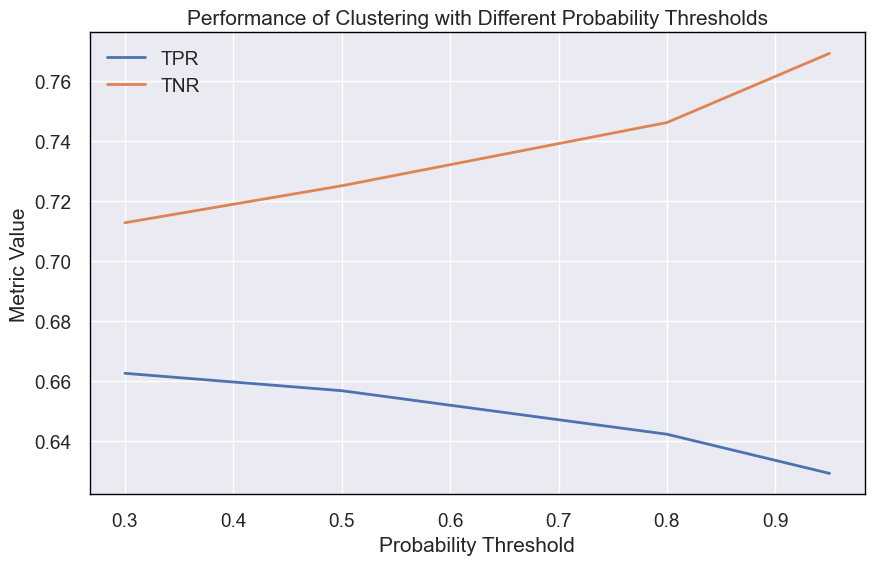

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score

# Define the probability thresholds
probability_thresholds = [0.3, 0.5, 0.8, 0.95]

# Initialize lists to store evaluation metrics
tpr_list = []
tnr_list = []
accuracy_list = []
precision_list = []
recall_list = []

# Iterate over each probability threshold
for threshold in probability_thresholds:
    # Calculate true positive rate (TPR) and true negative rate (TNR)
    true_positives = df_hfo_st[(df_hfo_st['soz_num'] == 1) & (df_hfo_st[f'high_amp_{threshold}'] == 1)].shape[0]
    false_negatives = df_hfo_st[(df_hfo_st['soz_num'] == 1) & (df_hfo_st[f'high_amp_{threshold}'] == 0)].shape[0]
    true_negatives = df_hfo_st[(df_hfo_st['soz_num'] == 0) & (df_hfo_st[f'high_amp_{threshold}'] == 0)].shape[0]
    false_positives = df_hfo_st[(df_hfo_st['soz_num'] == 0) & (df_hfo_st[f'high_amp_{threshold}'] == 1)].shape[0]
    
    tpr = true_positives / (true_positives + false_negatives)
    tnr = true_negatives / (true_negatives + false_positives)
    
    # Calculate other related measures
    accuracy = accuracy_score(df_hfo_st['soz_num'], df_hfo_st[f'high_amp_{threshold}'])
    precision = precision_score(df_hfo_st['soz_num'], df_hfo_st[f'high_amp_{threshold}'])
    recall = recall_score(df_hfo_st['soz_num'], df_hfo_st[f'high_amp_{threshold}'])

    # Append metrics to lists
    tpr_list.append(tpr)
    tnr_list.append(tnr)
    accuracy_list.append(accuracy)
    precision_list.append(precision)
    recall_list.append(recall)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(probability_thresholds, tpr_list, label='TPR')
plt.plot(probability_thresholds, tnr_list, label='TNR')
plt.xlabel('Probability Threshold')
plt.ylabel('Metric Value')
plt.title('Performance of Clustering with Different Probability Thresholds')
plt.legend()
plt.show()

<span style='color:blue'>
The probability threshold acts as a criterion for determining the amplitude level required to classify an HFO as pathologic (belonging to the high-amplitude cluster). By adjusting this threshold, you control the balance between correctly identifying pathologic HFOs (high TPR) and avoiding misclassification of non-pathologic HFOs (maintaining TNR).
    

As the probability threshold for clustering classification increases, there is a noticeable impact on both the true positive rate (TPR) and true negative rate (TNR). The TPR tends to increase, indicating a higher proportion of correctly identified positives (targets) among actual positives, which suggests improved sensitivity in target detection. However, this improvement in TPR is accompanied by a decrease in TNR, indicating a higher rate of false negatives and reduced specificity in identifying non-targets.

<hr style="margin-top:0.5cm; margin-bottom:0.5cm; border-top: 9px double #BBDDBB; background-color: #FFF"></hr><br>
<h2 style="margin-top:0.5cm; margin-bottom:0.5cm; color: green">Exercise 4. Cluster the stroke dataset</h2>

Using the dataset of the previous lab session (`240317-05-stroke.xlsx`), apply some clustering techniques to detect groups of patients at the moment of hospital admission (use only features acquired at this point), and compare them to the groups studied before as defined by IMP_GT5 or IMP_GT10 (improvement in RAVLT075 higher than 5 or 10 points).

Another interesting problem would be grouping patients according to the _LOS_ and _TASKS_ and see if this has anything to do with the aforementioned improvement.

<div class="alert alert-block alert-danger">
This exercise is optional. If you do the previous three exercises correctly, it will not grant you a better score, but it will be taken into account, for sure!
</div>

<div class="alert alert-block alert-info">
    Use as many additional markdown and code cells as you need to obtain and comment your results.
</div>

In [42]:
data_stroke = pd.read_excel(
    DATA_PATH / "240317-05-stroke.xlsx",
    engine="openpyxl")

data_stroke['IMP_GT10'] = np.where(data_stroke['IMP_RAVLT075'] >= 10, 1, 0)
# Encode categorical variables
data_stroke.rename(columns = {'SEX':'FEMALE'}, inplace = True)
data_stroke['FEMALE'] = np.where(data_stroke['FEMALE']=='FEMALE', True, False)
data_stroke['IMP_GT5'] = np.where(data_stroke['IMP_GT5']=='YES', 1, 0)

# Drop marital status and id
data_stroke.drop(columns=['MSTAT', 'ID','RAVLT0752','RAVLT0152','RAVLT015R2','FEPMR2'], inplace = True)

data_stroke2=data_stroke[['D2H','DIGMEM','RAVLT0751','RAVLT0151','RAVLT015R1','IMP_GT5','IMP_GT10']]


In [43]:
data_stroke2.isnull().sum()
data_stroke2.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 297 entries, 0 to 296
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   D2H         297 non-null    float64
 1   DIGMEM      285 non-null    float64
 2   RAVLT0751   274 non-null    float64
 3   RAVLT0151   270 non-null    float64
 4   RAVLT015R1  269 non-null    float64
 5   IMP_GT5     297 non-null    int32  
 6   IMP_GT10    297 non-null    int32  
dtypes: float64(5), int32(2)
memory usage: 14.1 KB


In [44]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=3)
data_stroke_filled = imputer.fit_transform(data_stroke2)
data_stroke_admission = pd.DataFrame(data_stroke_filled, columns = data_stroke2.columns)

In [45]:
data_stroke_admission.isnull().sum()

D2H           0
DIGMEM        0
RAVLT0751     0
RAVLT0151     0
RAVLT015R1    0
IMP_GT5       0
IMP_GT10      0
dtype: int64

In [47]:
data_stroke_admission

,D2H,DIGMEM,RAVLT0751,RAVLT0151,RAVLT015R1,IMP_GT5,IMP_GT10
0,30.533576,5.000000,49.000000,11.000000,14.000000,0.0,0.0
1,19.768275,4.000000,37.000000,7.000000,15.000000,0.0,0.0
2,18.744595,4.000000,31.000000,1.000000,0.000000,0.0,0.0
3,56.540139,4.000000,51.000000,14.000000,14.000000,0.0,0.0
4,39.662928,5.000000,56.000000,13.000000,15.000000,0.0,0.0
...,...,...,...,...,...,...,...
292,50.514201,5.000000,45.000000,10.000000,13.666667,1.0,1.0
293,33.422245,4.666667,36.333333,5.666667,12.666667,1.0,1.0
294,47.659144,2.000000,38.333333,4.000000,11.333333,1.0,1.0
295,32.540139,5.000000,33.666667,7.000000,10.333333,1.0,1.0


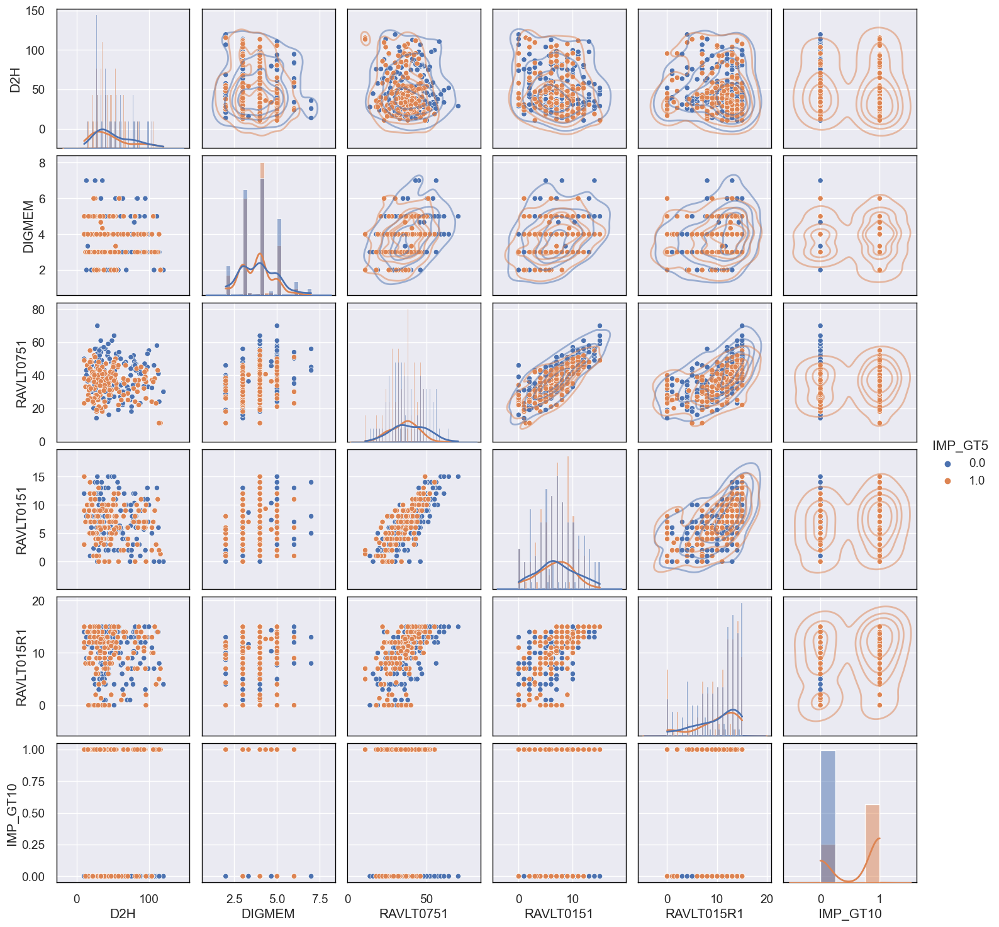

In [48]:
g = sns.pairplot(data_stroke_admission, hue="IMP_GT5", grid_kws={'despine': False})
g.map_upper(sns.kdeplot, levels=5, alpha=0.5)
g.map_diag(sns.histplot, binwidth=0.25, kde=True, fill=True);

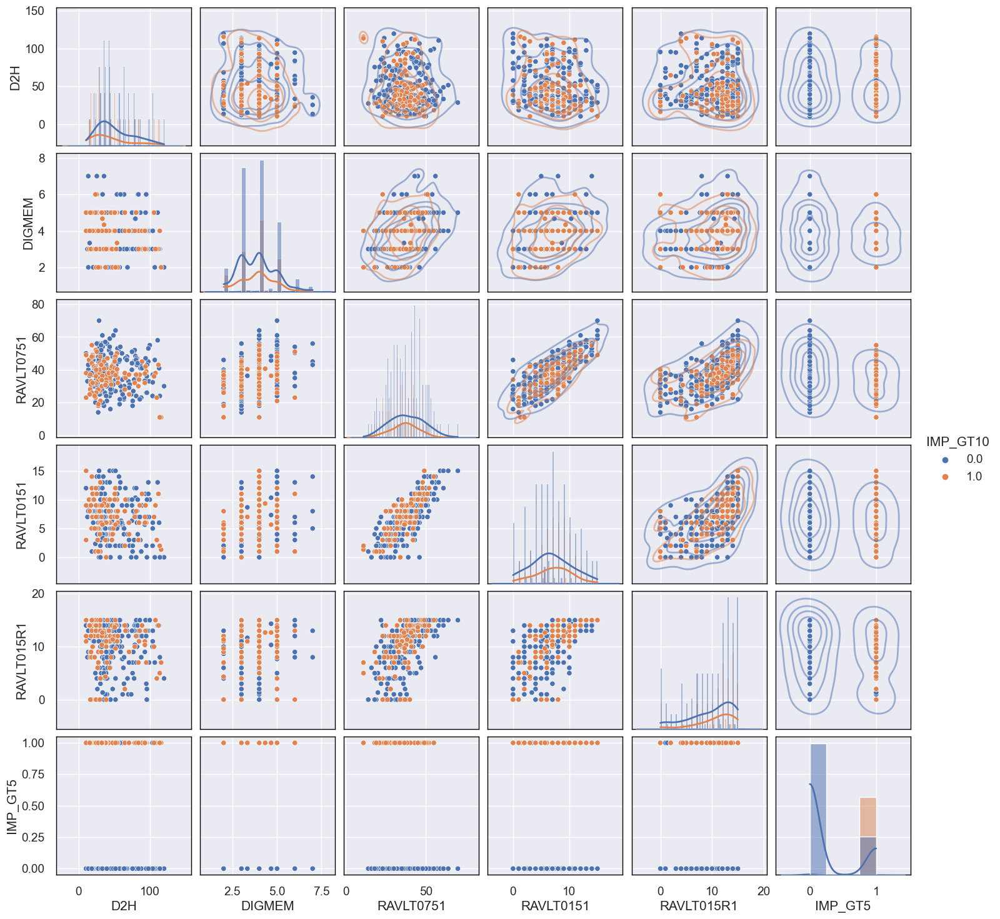

In [49]:
g = sns.pairplot(data_stroke_admission, hue="IMP_GT10", grid_kws={'despine': False})
g.map_upper(sns.kdeplot, levels=5, alpha=0.5)
g.map_diag(sns.histplot, binwidth=0.25, kde=True, fill=True);

In [50]:
selected_features = ['D2H','DIGMEM','RAVLT0751','RAVLT0151','RAVLT015R1']
X = data_stroke_admission[['D2H','DIGMEM','RAVLT0751','RAVLT0151','RAVLT015R1']]
y_5 = data_stroke_admission.IMP_GT5
y_10 = data_stroke_admission.IMP_GT10

scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

X.corr().style.background_gradient(cmap='coolwarm')



,D2H,DIGMEM,RAVLT0751,RAVLT0151,RAVLT015R1
D2H,1.000000,-0.040881,-0.088454,-0.159016,-0.009941
DIGMEM,-0.040881,1.000000,0.365390,0.301112,0.205863
RAVLT0751,-0.088454,0.365390,1.000000,0.797229,0.594497
RAVLT0151,-0.159016,0.301112,0.797229,1.000000,0.620263
RAVLT015R1,-0.009941,0.205863,0.594497,0.620263,1.000000


In [53]:
def compare_labels_clusters_stroke(dataframe, labels, ax1, ax2,feature1,feature2):
    plot_hfo_clusters(ax11, dataframe, feature1, feature2, y_10, 'Labelled Data')
    plot_hfo_clusters(ax12, dataframe, feature1, feature2, labels, 'Clustered Data')

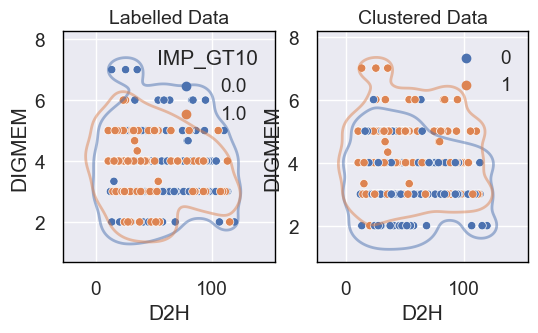

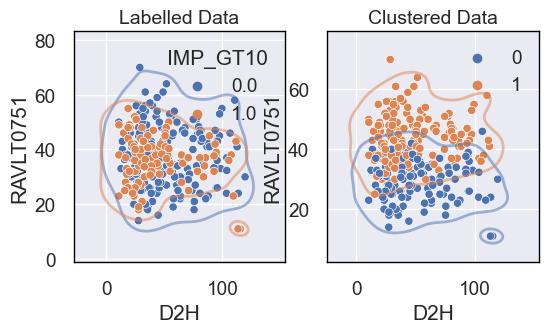

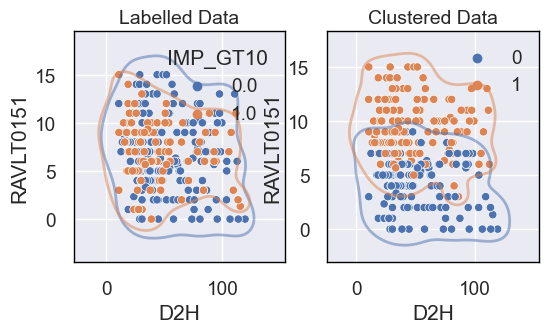

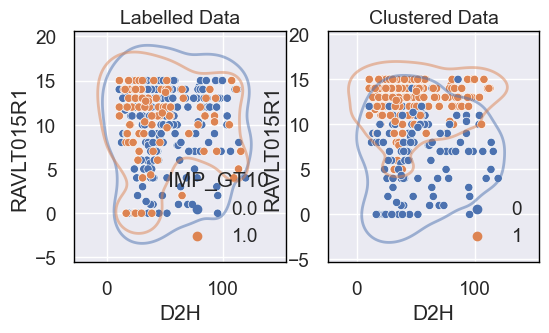

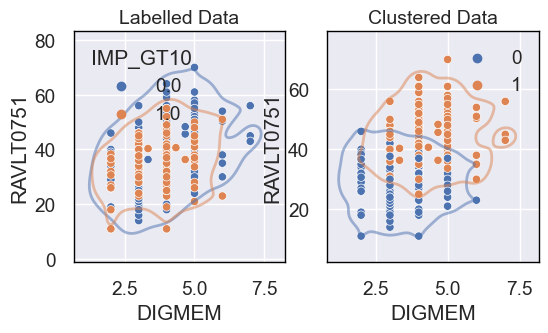

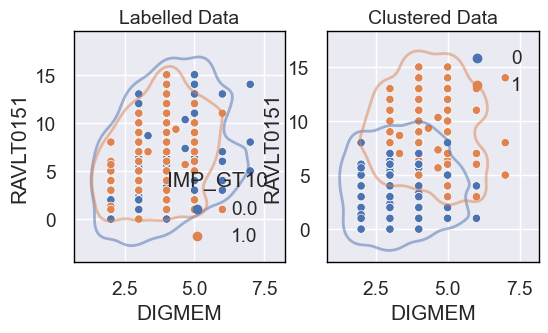

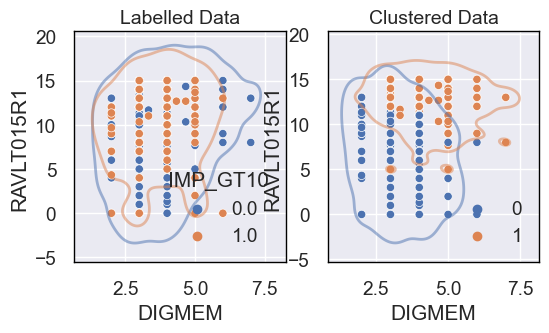

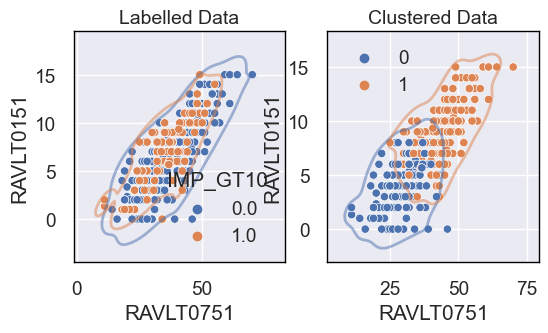

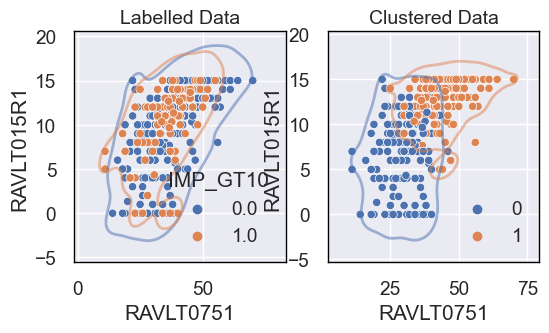

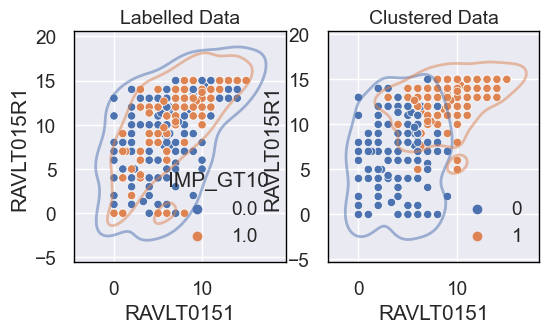

In [54]:
#KMEANS CLUSTER
km2 = KMeans(n_clusters=2, n_init="auto", random_state=42)
km2.fit(X_scaled)
km_pred=km2.predict(X_scaled)
data_stroke_admission['2-means'] = km2.labels_

fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, km2.labels_, ax11, ax12,'D2H','DIGMEM')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, km2.labels_, ax11, ax12,'D2H', 'RAVLT0751')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, km2.labels_, ax11, ax12,'D2H','RAVLT0151')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, km2.labels_, ax11, ax12,'D2H','RAVLT015R1')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, km2.labels_, ax11, ax12,'DIGMEM', 'RAVLT0751')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, km2.labels_, ax11, ax12,'DIGMEM', 'RAVLT0151')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, km2.labels_, ax11, ax12,'DIGMEM', 'RAVLT015R1')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, km2.labels_, ax11, ax12,'RAVLT0751', 'RAVLT0151')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, km2.labels_, ax11, ax12,'RAVLT0751', 'RAVLT015R1')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, km2.labels_, ax11, ax12,'RAVLT0151', 'RAVLT015R1')

In [55]:
# Compare clustering results with groups based on improvement
cluster_group_comparison = data_stroke_admission.groupby(['2-means', 'IMP_GT5']).size().unstack(fill_value=0)
print("Comparison of clustering results with groups based on IMP_GT5:")
print(cluster_group_comparison)

Comparison of clustering results with groups based on IMP_GT5:
IMP_GT5  0.0  1.0
2-means          
0         71   66
1         87   73


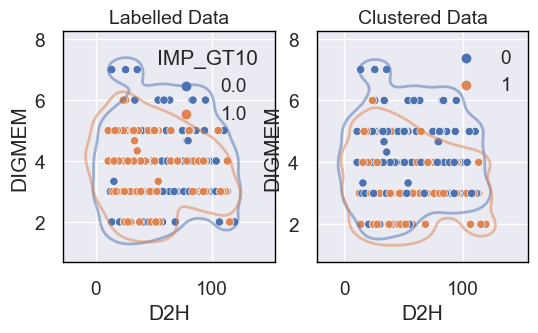

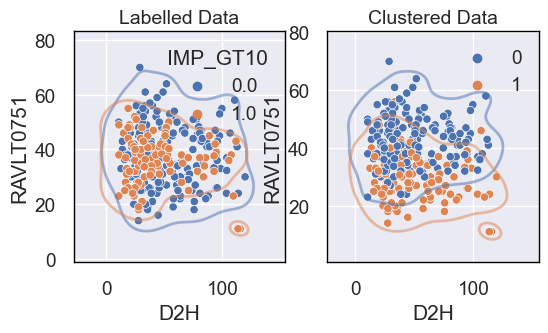

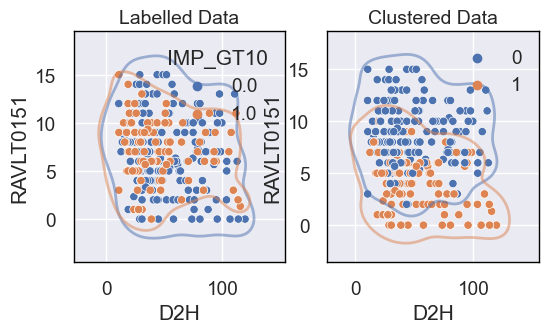

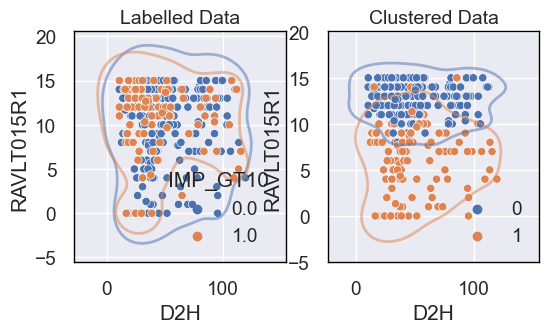

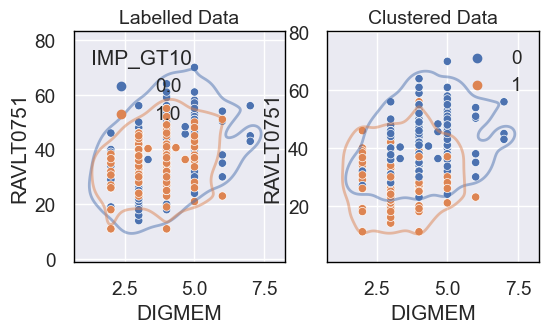

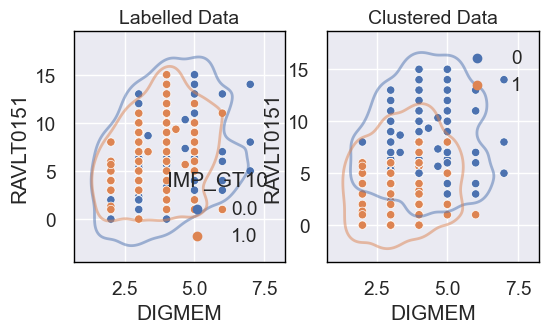

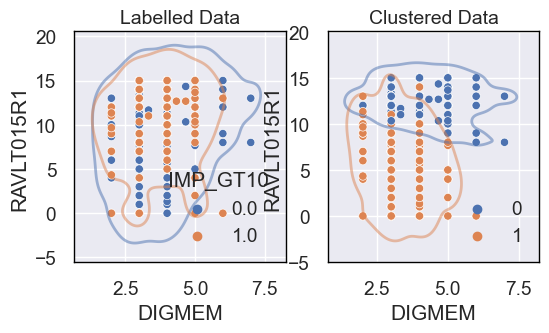

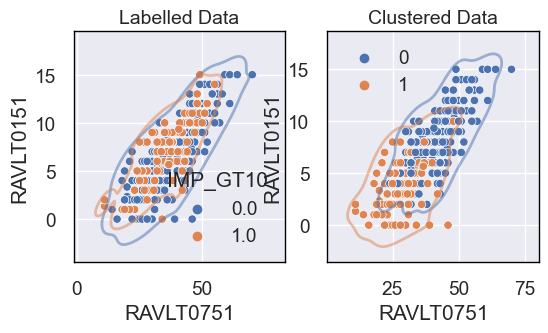

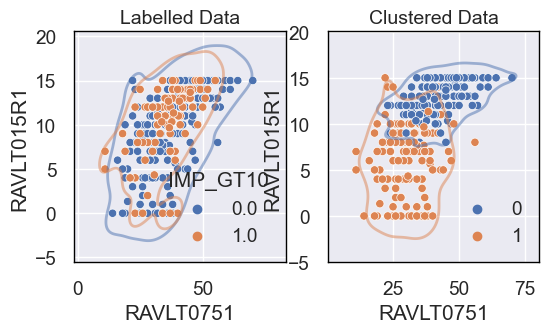

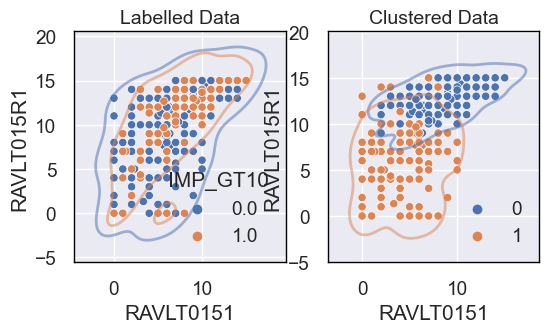

In [56]:
gmm2_1 = GaussianMixture(n_components=2, covariance_type='full')
gmm2_1.fit(X_scaled)
gmm2_labels_1 = gmm2_1.predict(X_scaled)

fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, gmm2_labels_1, ax11, ax12,'D2H','DIGMEM')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, gmm2_labels_1, ax11, ax12,'D2H', 'RAVLT0751')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, gmm2_labels_1, ax11, ax12,'D2H','RAVLT0151')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, gmm2_labels_1, ax11, ax12,'D2H','RAVLT015R1')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, gmm2_labels_1, ax11, ax12,'DIGMEM', 'RAVLT0751')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, gmm2_labels_1, ax11, ax12,'DIGMEM', 'RAVLT0151')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, gmm2_labels_1, ax11, ax12,'DIGMEM', 'RAVLT015R1')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, gmm2_labels_1, ax11, ax12,'RAVLT0751', 'RAVLT0151')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, gmm2_labels_1, ax11, ax12,'RAVLT0751', 'RAVLT015R1')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, gmm2_labels_1, ax11, ax12,'RAVLT0151', 'RAVLT015R1')

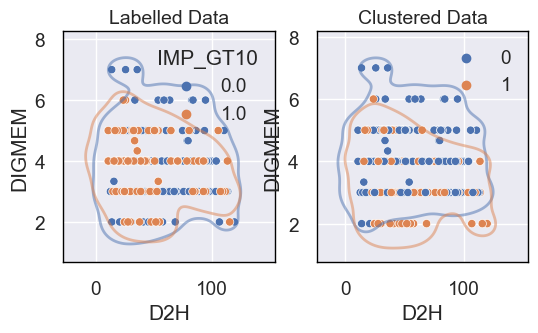

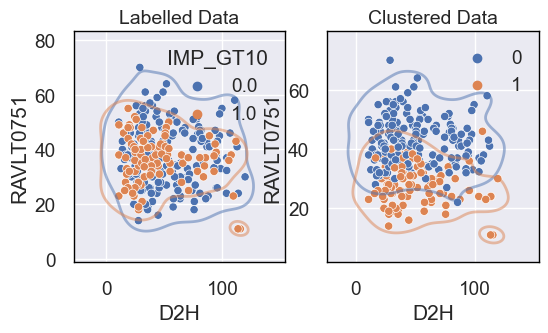

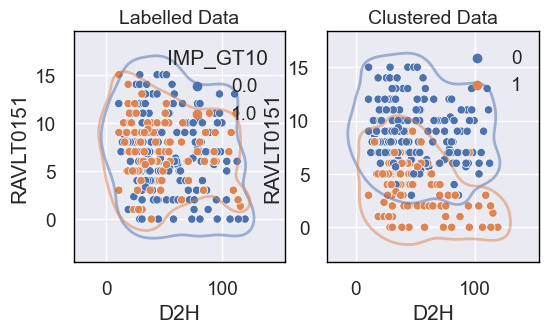

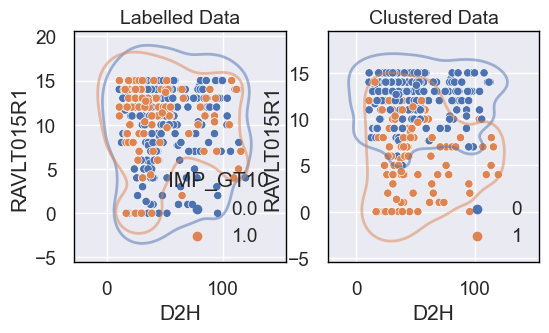

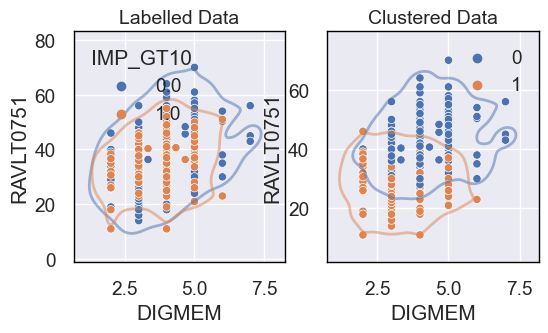

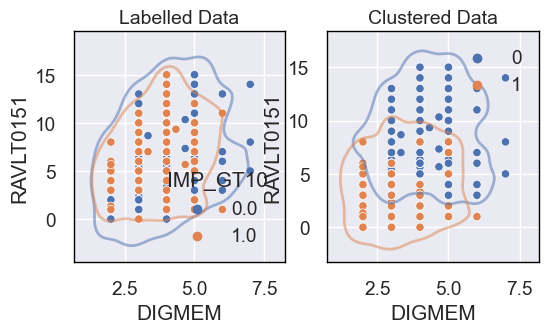

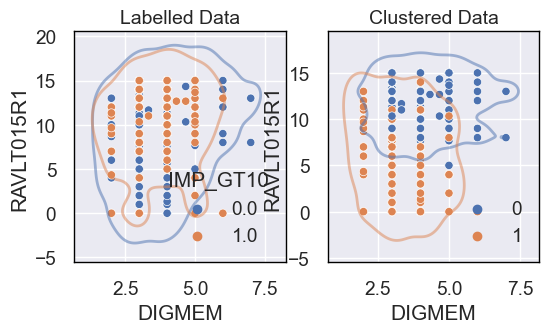

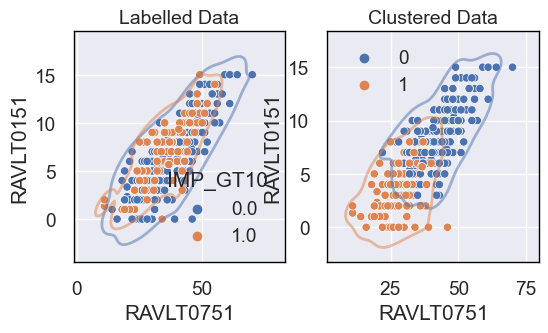

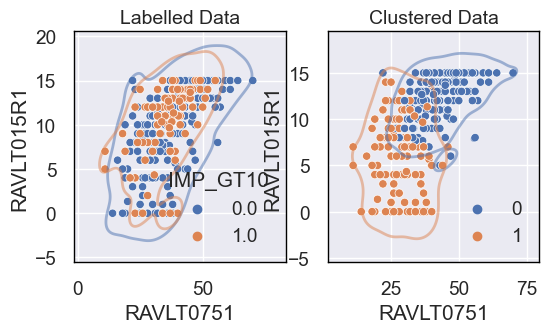

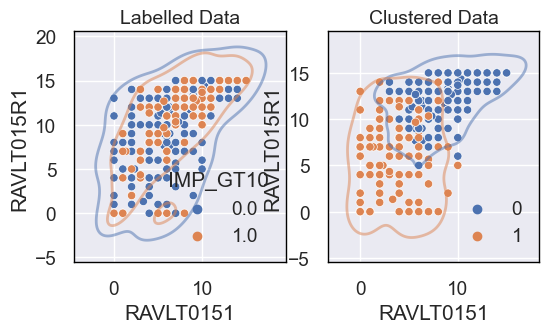

In [57]:
agg = AgglomerativeClustering(n_clusters=2,
                              metric='euclidean',
                              linkage='ward')
agg_pred=agg.fit_predict(X_scaled)


fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, agg.labels_, ax11, ax12,'D2H','DIGMEM')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, agg.labels_, ax11, ax12,'D2H', 'RAVLT0751')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, agg.labels_, ax11, ax12,'D2H','RAVLT0151')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, agg.labels_, ax11, ax12,'D2H','RAVLT015R1')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, agg.labels_, ax11, ax12,'DIGMEM', 'RAVLT0751')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, agg.labels_, ax11, ax12,'DIGMEM', 'RAVLT0151')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, agg.labels_, ax11, ax12,'DIGMEM', 'RAVLT015R1')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, agg.labels_, ax11, ax12,'RAVLT0751', 'RAVLT0151')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, agg.labels_, ax11, ax12,'RAVLT0751', 'RAVLT015R1')
fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(data_stroke_admission, agg.labels_, ax11, ax12,'RAVLT0151', 'RAVLT015R1')

In [58]:
from sklearn.metrics import davies_bouldin_score, adjusted_mutual_info_score, confusion_matrix, accuracy_score

cm_agg = confusion_matrix(y_5, agg_pred)
print(cm_agg)
print(accuracy_score(y_5,agg_pred))

cm_agg = confusion_matrix(y_10, agg_pred)
print(cm_agg)
print(accuracy_score(y_10,agg_pred))

[[100  58]
 [ 85  54]]
0.5185185185185185
[[123  81]
 [ 62  31]]
0.5185185185185185


In [59]:
cm_gmm = confusion_matrix(y_5, gmm2_labels_1)
print(cm_gmm)
print(accuracy_score(y_5,gmm2_labels_1))

cm_gmm = confusion_matrix(y_10, gmm2_labels_1)
print(cm_gmm)
print(accuracy_score(y_10,gmm2_labels_1))

[[95 63]
 [80 59]]
0.5185185185185185
[[114  90]
 [ 61  32]]
0.49158249158249157


In [60]:
cm_km = confusion_matrix(y_5, km_pred)
print(cm_km)
print(accuracy_score(y_5,km_pred))

cm_km = confusion_matrix(y_10, km_pred)
print(cm_km)
print(accuracy_score(y_10,km_pred))

[[71 87]
 [66 73]]
0.48484848484848486
[[ 98 106]
 [ 39  54]]
0.5117845117845118


<span style='color:blue'>Firstly, it can be seen that there is not many differences when using the 5 or 10 points prediction. Moreover, it is reinforced the same conclusion as the previous exercise, that it is very challenging to manipulate and classify experimentally recorded data. The cluster algorithms used above were those from which a better clustering was obtained, yet the results are not very promising. The other tested algorithms only detected one cluster, while it is clear that this problem requires 2 (either 0 or 1, either there was an improvement or not). One of the issues that may be leading to these results is the fact that the features used are signifficantly correlated. In fact, only 'DIGMEM' and 'D2H' could be considered to be low correlated to the rest of the data, that have correlation coefficients than approximately 0.6 between them. The best accuracy was obtained with the AgglomerativeClustering, with a value of accuracy of 0.51, which is in fact very low. 
    
<span style='color:blue'>Moreover, the data could not be fully preprocessed. Provided that we are working with scores, and there are a signifficant number of 0 values, the logaritmic transformation could not be applied to remove the outliers. 

In [61]:
df2=data_stroke[['LOS','NTASKS','IMP_GT10']]
df2['log_LOS'] = np.log10(df2['LOS'])
df2['log_NTASKS'] = np.log10(df2['NTASKS'])


X2=data_stroke[['LOS','NTASKS']]

y=data_stroke.IMP_GT10
df2

,LOS,NTASKS,IMP_GT10,log_LOS,log_NTASKS
0,132.131829,248,0,2.121007,2.394452
1,73.966840,181,0,1.869037,2.257679
2,36.917766,49,0,1.567235,1.690196
3,35.243981,57,0,1.547085,1.755875
4,68.989340,75,0,1.838782,1.875061
...,...,...,...,...,...
292,41.038252,39,1,1.613189,1.591065
293,112.234178,240,1,2.050125,2.380211
294,117.959062,167,1,2.071731,2.222716
295,77.162488,65,1,1.887406,1.812913


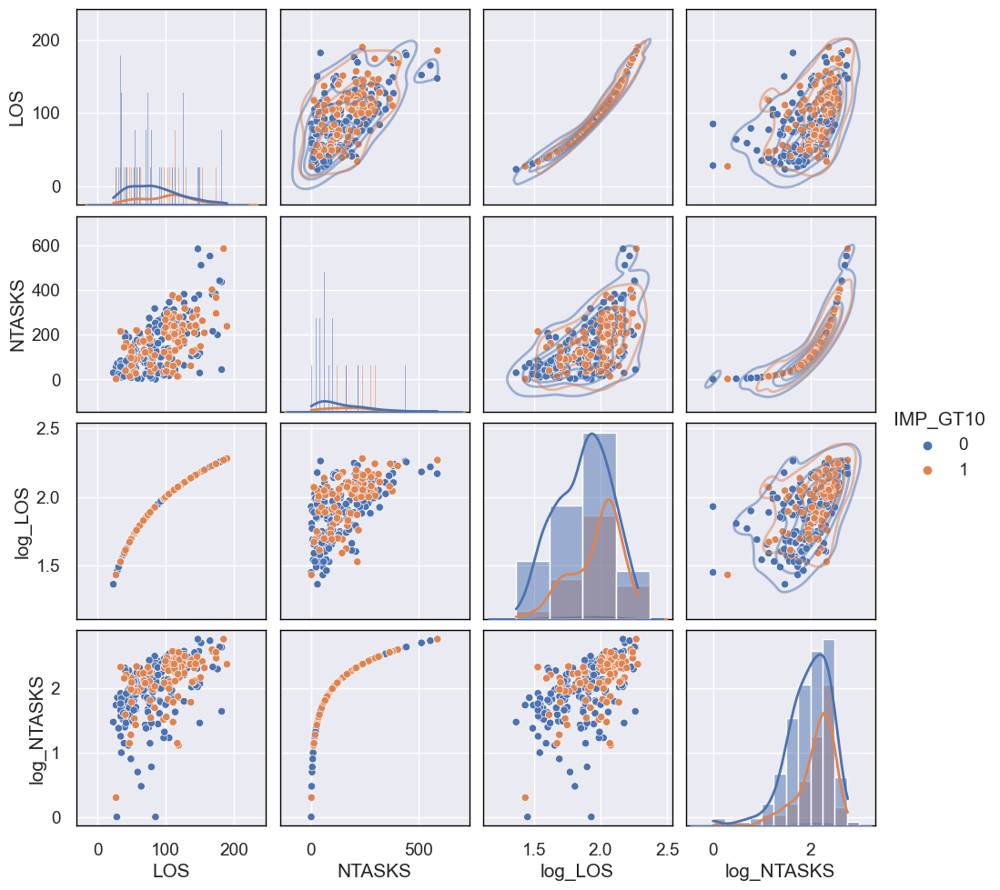

In [62]:
g = sns.pairplot(df2, hue="IMP_GT10", grid_kws={'despine': False})
g.map_upper(sns.kdeplot, levels=5, alpha=0.5)
g.map_diag(sns.histplot, binwidth=0.25, kde=True, fill=True);

In [63]:
selected_features = ['LOS','NTASKS','log_LOS','log_NTASKS']

scaler = StandardScaler()
scaler.fit(df2)
X_scaled = scaler.transform(df2)

X2.corr().style.background_gradient(cmap='coolwarm')



,LOS,NTASKS
LOS,1.000000,0.625867
NTASKS,0.625867,1.000000


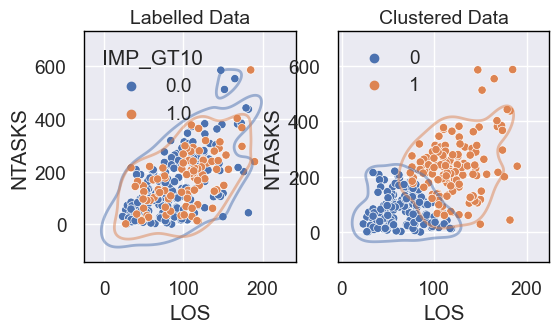

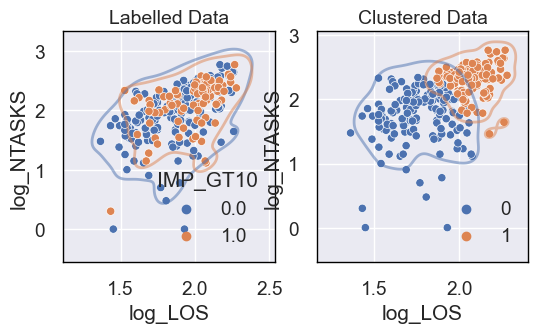

In [64]:
km2 = KMeans(n_clusters=2, n_init="auto", random_state=42)
km2.fit(X_scaled)
km_pred=km2.predict(X_scaled)
df2['2-means'] = km2.labels_

fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(df2, km2.labels_, ax11, ax12,'LOS','NTASKS')

fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(df2, km2.labels_, ax11, ax12,'log_LOS','log_NTASKS')


In [65]:
# Compare clustering results with groups based on improvement in RAVLT075
cluster_group_comparison = df2.groupby(['2-means', 'IMP_GT10']).size().unstack(fill_value=0)
print("Comparison of clustering results with groups based on IMP_GT10:")
print(cluster_group_comparison)

Comparison of clustering results with groups based on IMP_GT10:
IMP_GT10    0   1
2-means          
0         128  35
1          76  58


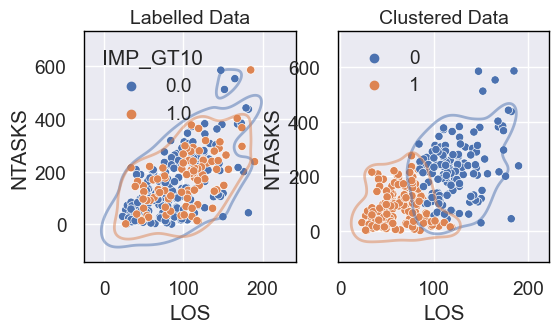

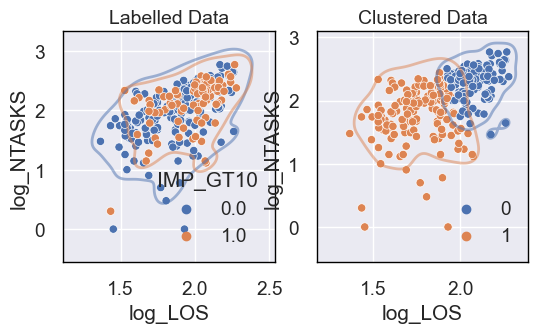

In [66]:
gmm2_1 = GaussianMixture(n_components=2, covariance_type='full')
gmm2_1.fit(X_scaled)
gmm2_labels_1 = gmm2_1.predict(X_scaled)

fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(df2, gmm2_labels_1, ax11, ax12,'LOS','NTASKS')

fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(df2, gmm2_labels_1, ax11, ax12,'log_LOS','log_NTASKS')

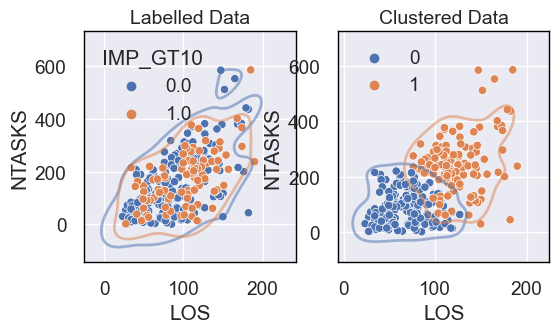

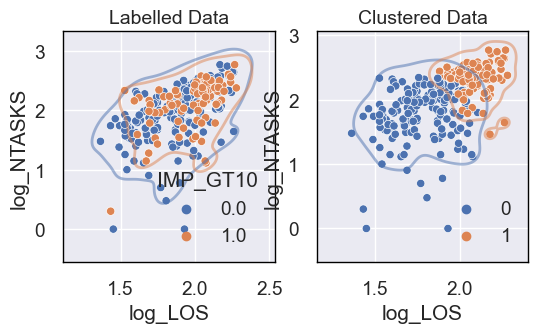

In [67]:
agg = AgglomerativeClustering(n_clusters=2,
                              metric='euclidean',
                              linkage='ward')
agg_pred=agg.fit_predict(X_scaled)

fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(df2, agg_pred, ax11, ax12,'LOS','NTASKS')

fig, (ax11, ax12) = plt.subplots(nrows=1, ncols=2,figsize=(6, 3))
compare_labels_clusters_stroke(df2, agg_pred, ax11, ax12,'log_LOS','log_NTASKS')


In [68]:
cm_agg = confusion_matrix(y_10, agg_pred)
print(cm_agg)
print(accuracy_score(y_10,agg_pred))

[[142  62]
 [ 38  55]]
0.6632996632996633


In [69]:
cm_gmm = confusion_matrix(y_10, gmm2_labels_1)
print(cm_gmm)
print(accuracy_score(y_10,gmm2_labels_1))

[[ 79 125]
 [ 55  38]]
0.3939393939393939


In [70]:
cm_km = confusion_matrix(y_10, km_pred)
print(cm_km)
print(accuracy_score(y_10,km_pred))

[[128  76]
 [ 35  58]]
0.6262626262626263


<span style='color:blue'>As it can be seen, the data can be more easily clustered using 'los' and 'NTASKS'. It can be seen on the correlation matrix that those two variables are pretty correlated. This makes sense taking into account that more days at the hospital may involve a higher number of tasks for rehabilitation. It can be seen now, that the accuracy value for the AgglomerativeClustering is 0.66, which is pretty high compared to the previous results, and taking into account that the algorithm is predicting values based on experimental data. This may suggest that the days at the hospital and the number of tasks performed, influences more the outcome of the improvement at 10 days than the conditions at the admission time. 